# AromaticFlowersBD: Deep Learning Pipeline — **WITH CLAHE**
## Multi-Model CNN with Scheduler Comparison, Weighted Ensemble & Grad-CAM

**Dataset:** AromaticFlowersBD (Mendeley Data, DOI: 10.17632/327kkgxzdn.1)
**Classes:** 12 Aromatic Flower Species
**Preprocessing mode of this notebook:** `USE_CLAHE = True`

This notebook is one of **two self-contained, independently-executable companion
notebooks**:

| Notebook | Preprocessing |
|---|---|
| `aromaticflowersbd_with_clahe.ipynb` | CLAHE applied to **train, validation, and test** sets |
| `aromaticflowersbd_without_clahe.ipynb` | CLAHE **never** applied to any split |

Only one preprocessing condition is used throughout this notebook — every
dataset split (train / validation / test) and every experiment (scheduler
comparison, main training, augmentation ablation, ensemble, Grad-CAM) shares the
exact same `CLAHE` transform pipeline. There is
no mixing of preprocessing between splits or between experiments.

### Pipeline contents
| # | Section | Details |
|---|---------|---------|
| 1 | Data analysis & cleaning | Corrupted/duplicate removal, class distribution, resolution stats |
| 2 | Stratified 60/20/20 split | Train / Validation / Test, fixed seed |
| 3 | Preprocessing | CLAHE (LAB-space contrast enhancement) applied consistently to all splits |
| 4 | Augmentation (8 techniques) | H-Flip, V-Flip, Rotate ±90°, Brightness ±30%, 3px Blur, 2.5% Pixel Noise — applied only to the training split |
| 5 | LR Scheduler experiment | **EfficientNetB0** trained with 4 schedulers (CosineAnnealingLR, StepLR, ReduceLROnPlateau, OneCycleLR) |
| 6 | Main training | 4 backbones (ResNet50, DenseNet121, EfficientNetB0, ConvNeXt-Tiny) with the best scheduler |
| 7 | Evaluation | Metrics, confusion matrices, ROC curves |
| 8 | Grad-CAM | Individual models **and** the Weighted Ensemble, same format |


Reproducibility: a fixed random seed (`SEED = 42`) is used everywhere — data
split, augmentation sampling, model init, and training.


## Phase 0: Environment Setup & Library Installation

In [ ]:
# Install required libraries
!pip install -q timm imagehash scikit-learn seaborn matplotlib opencv-python-headless grad-cam torchmetrics statsmodels

import os
import sys
import random
import shutil
import warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns
from pathlib import Path
from PIL import Image, ImageFilter, ImageEnhance
from collections import Counter, defaultdict
from tqdm.notebook import tqdm
import imagehash
import cv2
import copy
import time
import json

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, models
import timm

from sklearn.model_selection import train_test_split
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score,
    matthews_corrcoef, cohen_kappa_score, roc_auc_score,
    confusion_matrix, classification_report, roc_curve, auc,
)
from sklearn.preprocessing import label_binarize
from scipy.stats import wilcoxon, spearmanr
from scipy import stats
from statsmodels.stats.contingency_tables import mcnemar
import pickle

warnings.filterwarnings('ignore')

# ============================================================
# THE single switch that decides this notebook's preprocessing.
# ============================================================
USE_CLAHE = True

# Reproducibility
SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed_all(SEED)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'Device: {DEVICE}')
if torch.cuda.is_available():
    print(f'GPU: {torch.cuda.get_device_name(0)}')
    print(f'VRAM: {torch.cuda.get_device_properties(0).total_memory / 1e9:.2f} GB')
print(f'USE_CLAHE = {USE_CLAHE}  (WITH CLAHE)')

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.5/44.5 kB 2.7 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.7/296.7 kB 12.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 983.4/983.4 kB 44.1 MB/s eta 0:00:00
Device: cuda
GPU: Tesla T4
VRAM: 15.64 GB
USE_CLAHE = True  (WITH CLAHE)


## Phase 1: Configuration & Dataset Path Setup

In [ ]:
from google.colab import drive

# 1. Mount Google Drive
drive.mount('/content/drive', force_remount=False)

# ============================================================
# CONFIGURATION — Set path to your dataset in Google Drive
# ============================================================

# 👈 CHANGE THIS to match the exact path in your Google Drive
DRIVE_DATASET_PATH = Path('/content/drive/MyDrive/aromaticflowersbd')

if DRIVE_DATASET_PATH.exists():
    DATA_ROOT = DRIVE_DATASET_PATH
    print(f'✓ Found dataset at Google Drive path: {DATA_ROOT}')
else:
    # Fallback search inside Google Drive if exact path is not found directly
    drive_search = list(Path('/content/drive/MyDrive').rglob('aromaticflowersbd'))
    if drive_search:
        DATA_ROOT = drive_search[0]
        print(f'✓ Located dataset in Google Drive: {DATA_ROOT}')
    else:
        raise FileNotFoundError(
            f"Could not find dataset at {DRIVE_DATASET_PATH}. "
            "Please update DRIVE_DATASET_PATH to your exact Google Drive folder."
        )

# ── Hyperparameters ──────────────────────────────────────────
IMG_SIZE     = 224
BATCH_SIZE   = 32
NUM_EPOCHS   = 10
LR           = 1e-4
WEIGHT_DECAY = 1e-4
NUM_WORKERS  = 2  # Set to 2 for Colab CPU limits to prevent DataLoader crashes
PATIENCE     = 7

IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD  = [0.229, 0.224, 0.225]

# Output directory stored locally on fast Colab SSD
_BASE_OUT = Path('/content/outputs')
OUT_DIR = _BASE_OUT / 'with_clahe'
OUT_DIR.mkdir(parents=True, exist_ok=True)
(OUT_DIR / 'models').mkdir(exist_ok=True)
(OUT_DIR / 'figures').mkdir(exist_ok=True)
(OUT_DIR / 'gradcam').mkdir(exist_ok=True)
print('Local Output Directory:', OUT_DIR)

CLASS_NAMES = [
    'Bakul', 'Beli', 'Champa', 'Golap', 'Hasna Hena',
    'Jui', 'Kath Golap', 'Madhobi Lata', 'Rajani Gandha',
    'Sheuli', 'Sondha Maloti', 'Tagar'
]
NUM_CLASSES = len(CLASS_NAMES)
print(f'Classes ({NUM_CLASSES}): {CLASS_NAMES}')

Mounted at /content/drive
✓ Found dataset at Google Drive path: /content/drive/MyDrive/aromaticflowersbd
Local Output Directory: /content/outputs/with_clahe
Classes (12): ['Bakul', 'Beli', 'Champa', 'Golap', 'Hasna Hena', 'Jui', 'Kath Golap', 'Madhobi Lata', 'Rajani Gandha', 'Sheuli', 'Sondha Maloti', 'Tagar']


## Phase 1b: Google Drive Integration (Auto-Checkpointing)

Run on **Colab**: mounts Drive and saves checkpoints to `MyDrive/AromaticFlowersBD/checkpoints/with_clahe/`.
On **Kaggle**: falls back to `/kaggle/working/models/` automatically — no code change needed.

In [ ]:
# Set directory in Google Drive where model checkpoints will be saved permanently
DRIVE_CKPT_DIR = Path('/content/drive/MyDrive/Aromatic Flower dataset/checkpoints/with_clahe')
DRIVE_CKPT_DIR.mkdir(parents=True, exist_ok=True)
DRIVE_AVAILABLE = True
print(f'Google Drive Checkpoint Directory -> {DRIVE_CKPT_DIR}')


def save_to_drive(model, model_name: str, tag: str,
                  epoch: int, val_acc: float, val_loss: float):
    """
    Save model checkpoint directly to Google Drive to protect against Colab disconnects.
    Filename: {model_name}_{tag}_ep{epoch:02d}_acc{val_acc:.2f}.pth
    """
    fname = f'{model_name}_{tag}_ep{epoch:02d}_acc{val_acc:.2f}.pth'
    ckpt = {
        'epoch': epoch,
        'model_name': model_name,
        'tag': tag,
        'val_acc': val_acc,
        'val_loss': val_loss,
        'model_state_dict': model.state_dict(),
    }

    # Save directly to Google Drive
    save_path = DRIVE_CKPT_DIR / fname
    torch.save(ckpt, save_path)

    # Also save a local copy in /content/outputs/with_clahe/models/
    local_path = OUT_DIR / 'models' / fname
    torch.save(ckpt, local_path)

    print(f'  -> Checkpoint saved to Drive & Local: {fname}')


print('Drive checkpoint helper ready.')

Google Drive Checkpoint Directory -> /content/drive/MyDrive/Aromatic Flower dataset/checkpoints/with_clahe
Drive checkpoint helper ready.


## Phase 2: Dataset Inspection & Analysis

In [ ]:
def collect_image_paths(root: Path):
    """Recursively collect all image paths with their class labels."""
    records = []
    valid_ext = {'.jpg', '.jpeg', '.png', '.bmp', '.tiff'}

    for class_dir in sorted(root.iterdir()):
        if not class_dir.is_dir():
            continue
        label = class_dir.name
        for img_path in class_dir.rglob('*'):
            if img_path.suffix.lower() in valid_ext:
                records.append({'path': str(img_path), 'label': label})

    return pd.DataFrame(records)

# Collect all images
df_all = collect_image_paths(DATA_ROOT)
print(f'Total images found: {len(df_all)}')


Total images found: 3607


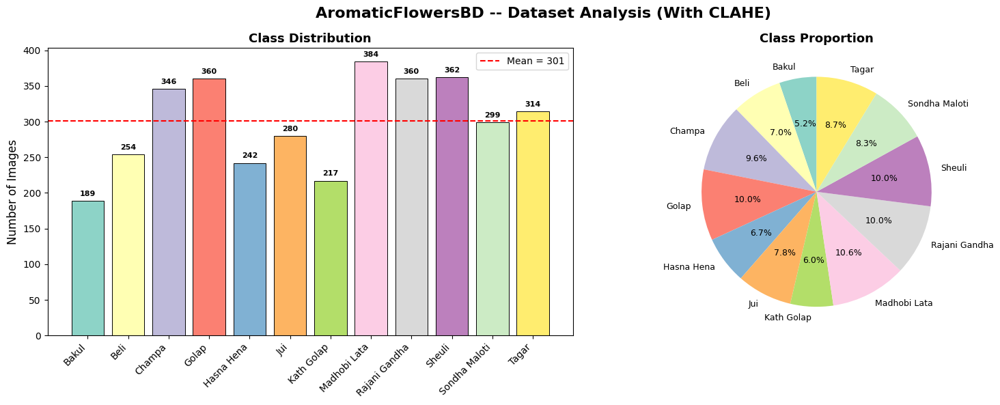

Min: 189 (Bakul)  Max: 384 (Madhobi Lata)
Imbalance Ratio: 2.03x


In [ ]:
# ---- Class Distribution Analysis ----
class_counts = df_all['label'].value_counts().sort_index()

fig, axes = plt.subplots(1, 2, figsize=(16, 6))
fig.suptitle(f'AromaticFlowersBD -- Dataset Analysis ({'With CLAHE' if USE_CLAHE else 'Without CLAHE'})', fontsize=16, fontweight='bold')

colors = plt.cm.Set3(np.linspace(0, 1, NUM_CLASSES))
bars = axes[0].bar(range(len(class_counts)), class_counts.values, color=colors, edgecolor='black', linewidth=0.7)
axes[0].set_xticks(range(len(class_counts)))
axes[0].set_xticklabels(class_counts.index, rotation=45, ha='right', fontsize=10)
axes[0].set_ylabel('Number of Images', fontsize=12)
axes[0].set_title('Class Distribution', fontsize=13, fontweight='bold')
axes[0].axhline(y=class_counts.mean(), color='red', linestyle='--', label=f'Mean = {class_counts.mean():.0f}')
axes[0].legend(fontsize=10)
for bar, val in zip(bars, class_counts.values):
    axes[0].text(bar.get_x() + bar.get_width()/2, bar.get_height() + 5,
                 str(val), ha='center', va='bottom', fontsize=8, fontweight='bold')

axes[1].pie(class_counts.values, labels=class_counts.index, autopct='%1.1f%%',
            colors=colors, startangle=90, textprops={'fontsize': 9})
axes[1].set_title('Class Proportion', fontsize=13, fontweight='bold')

plt.tight_layout()
plt.savefig(OUT_DIR / 'figures' / 'class_distribution.png', dpi=300, bbox_inches='tight')
plt.show()
print(f'Min: {class_counts.min()} ({class_counts.idxmin()})  Max: {class_counts.max()} ({class_counts.idxmax()})')
print(f'Imbalance Ratio: {class_counts.max()/class_counts.min():.2f}x')


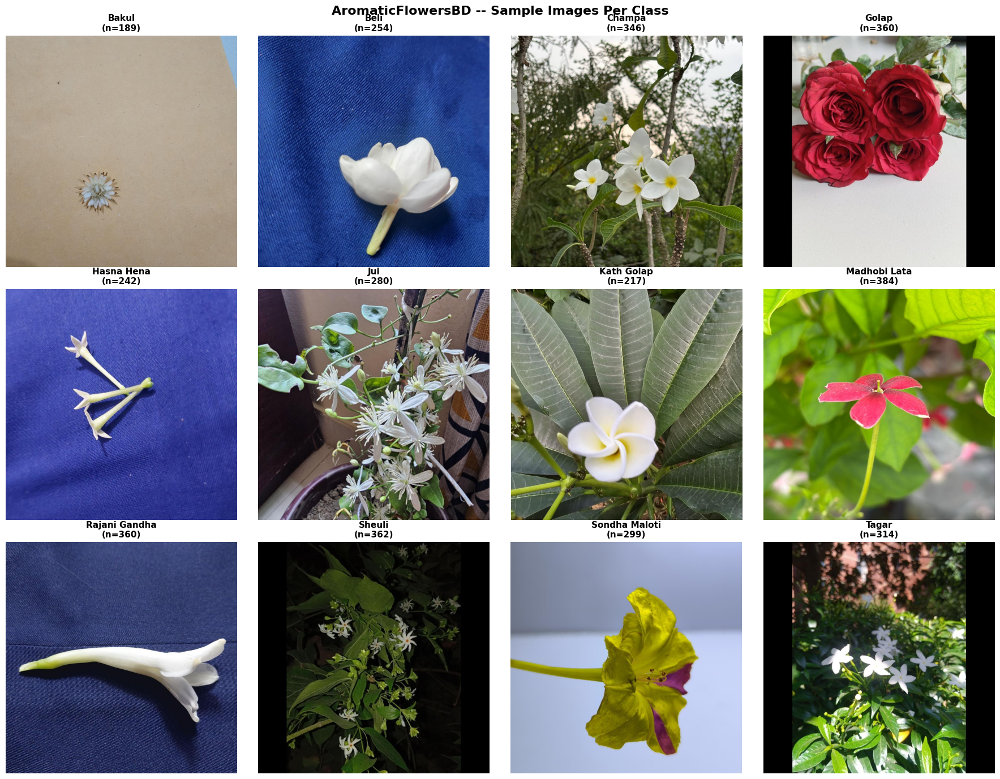

In [ ]:
# ---- Sample Images Per Class ----
fig, axes = plt.subplots(3, 4, figsize=(18, 14))
fig.suptitle('AromaticFlowersBD -- Sample Images Per Class', fontsize=16, fontweight='bold')
axes = axes.flatten()

for idx, cls in enumerate(sorted(df_all['label'].unique())):
    cls_samples = df_all[df_all['label'] == cls].sample(1, random_state=SEED)
    img_path = cls_samples.iloc[0]['path']
    try:
        img = Image.open(img_path).convert('RGB')
        axes[idx].imshow(img)
        axes[idx].set_title(f'{cls}\n(n={len(df_all[df_all["label"]==cls])})',
                            fontsize=11, fontweight='bold')
        axes[idx].axis('off')
    except Exception:
        axes[idx].axis('off')

plt.tight_layout()
plt.savefig(OUT_DIR / 'figures' / 'sample_images_per_class.png', dpi=300, bbox_inches='tight')
plt.show()


## Phase 3: Data Cleaning (Corrupted & Duplicate Removal)

In [ ]:
# ---- Step 1: Remove Corrupted Images ----
print('Checking for corrupted images...')
corrupted = []
# for _, row in tqdm(df_all.iterrows(), total=len(df_all)):
#     try:
#         with Image.open(row['path']) as img:
#             img.verify()
#     except Exception:
#         corrupted.append(row['path'])

print(f'Corrupted images found: {len(corrupted)}')
df_clean = df_all[~df_all['path'].isin(corrupted)].reset_index(drop=True)
print(f'Images after corruption removal: {len(df_clean)}')


Checking for corrupted images...
Corrupted images found: 0
Images after corruption removal: 3607


In [ ]:
# ---- Step 2: Duplicate Removal using Perceptual Hash ----
print('Checking for duplicate images using perceptual hashing...')
hash_dict = defaultdict(list)
# for _, row in tqdm(df_clean.iterrows(), total=len(df_clean)):
#     try:
#         with Image.open(row['path']) as img:
#             h = str(imagehash.phash(img))
#             hash_dict[h].append(row['path'])
#     except Exception:
#         pass

duplicates = []
# for h, paths in hash_dict.items():
#     if len(paths) > 1:
#         duplicates.extend(paths[1:])

print(f'Duplicate images found: {len(duplicates)}')
df_clean = df_clean[~df_clean['path'].isin(duplicates)].reset_index(drop=True)

print(f'\nData Cleaning Summary:')
print(f'  Original images:    {len(df_all)}')
print(f'  Corrupted removed:  {len(corrupted)}')
print(f'  Duplicates removed: {len(duplicates)}')
print(f'  Clean images:       {len(df_clean)}')


Checking for duplicate images using perceptual hashing...
Duplicate images found: 0

Data Cleaning Summary:
  Original images:    3607
  Corrupted removed:  0
  Duplicates removed: 0
  Clean images:       3607


## Phase 4: Train / Validation / Test Split (Stratified 60/20/20)

The dataset has a large enough number of images per class that a **60% train / 20% validation / 20% test** split still leaves sufficient data in each split for reliable validation and testing, while giving the model more training examples than a 70/15/15 split.

Train:      2164 images (60.0%)
Validation: 721 images (20.0%)
Test:       722 images (20.0%)

Class weights (inverse-frequency, computed from TRAIN split):
  Bakul          : n_train=114   weight=1.5085
  Beli           : n_train=153   weight=1.1240
  Champa         : n_train=208   weight=0.8268
  Golap          : n_train=216   weight=0.7962
  Hasna Hena     : n_train=145   weight=1.1860
  Jui            : n_train=168   weight=1.0237
  Kath Golap     : n_train=130   weight=1.3229
  Madhobi Lata   : n_train=230   weight=0.7477
  Rajani Gandha  : n_train=216   weight=0.7962
  Sheuli         : n_train=217   weight=0.7925
  Sondha Maloti  : n_train=179   weight=0.9607
  Tagar          : n_train=188   weight=0.9148


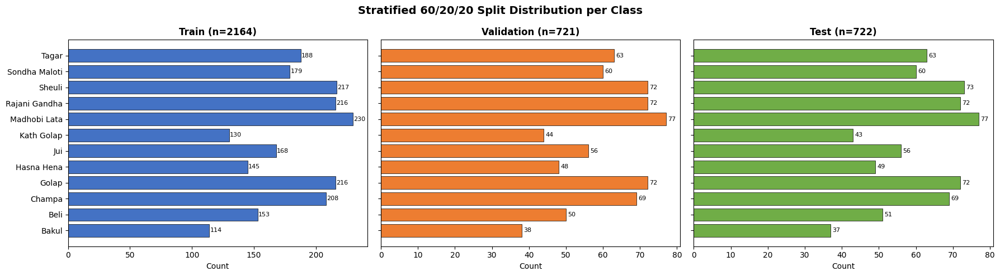

In [ ]:
# Create label encoding
unique_labels = sorted(df_clean['label'].unique())
label2idx = {l: i for i, l in enumerate(unique_labels)}
idx2label = {i: l for l, i in label2idx.items()}
df_clean['label_idx'] = df_clean['label'].map(label2idx)

# Stratified 60/20/20 split
X = df_clean['path'].values
y = df_clean['label_idx'].values

# First: 60% train, 40% temp
X_train, X_temp, y_train, y_temp = train_test_split(
    X, y, test_size=0.40, stratify=y, random_state=SEED
)
# Then: split temp 50/50 -> 20% val, 20% test
X_val, X_test, y_val, y_test = train_test_split(
    X_temp, y_temp, test_size=0.50, stratify=y_temp, random_state=SEED
)

print(f'Train:      {len(X_train)} images ({len(X_train)/len(df_clean)*100:.1f}%)')
print(f'Validation: {len(X_val)} images ({len(X_val)/len(df_clean)*100:.1f}%)')
print(f'Test:       {len(X_test)} images ({len(X_test)/len(df_clean)*100:.1f}%)')

# ── Class weights for imbalanced CrossEntropyLoss ──
# Inverse-frequency weights computed from the TRAIN split only (never from
# val/test, to avoid leaking split information), rescaled to average to 1.0.
train_class_counts = np.bincount(y_train, minlength=len(unique_labels))
class_weights_np = 1.0 / train_class_counts
class_weights_np = class_weights_np / class_weights_np.sum() * len(unique_labels)
class_weights = torch.FloatTensor(class_weights_np).to(DEVICE)

print('\nClass weights (inverse-frequency, computed from TRAIN split):')
for name, cnt, w in zip(unique_labels, train_class_counts, class_weights_np):
    print(f'  {name:<15}: n_train={cnt:<4d}  weight={w:.4f}')

# Visualize split distribution
fig, axes = plt.subplots(1, 3, figsize=(18, 5), sharey=True)
splits = [('Train', y_train), ('Validation', y_val), ('Test', y_test)]
colors_split = ['#4472C4', '#ED7D31', '#70AD47']

for ax, (split_name, labels), color in zip(axes, splits, colors_split):
    counts = Counter(labels)
    names = [idx2label[i] for i in sorted(counts.keys())]
    values = [counts[i] for i in sorted(counts.keys())]
    ax.barh(names, values, color=color, edgecolor='black', linewidth=0.5)
    ax.set_title(f'{split_name} (n={len(labels)})', fontweight='bold', fontsize=12)
    ax.set_xlabel('Count')
    for i, v in enumerate(values):
        ax.text(v + 0.5, i, str(v), va='center', fontsize=8)

plt.suptitle('Stratified 60/20/20 Split Distribution per Class', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig(OUT_DIR / 'figures' / 'split_distribution.png', dpi=300, bbox_inches='tight')
plt.show()


## Phase 5: Preprocessing with CLAHE

CLAHE (Contrast Limited Adaptive Histogram Equalization) is applied in LAB color space. Because `USE_CLAHE = True` in this notebook, CLAHE is applied identically to **every** split — train, validation, and test — so there is no mismatch between how training images and evaluation images are preprocessed.

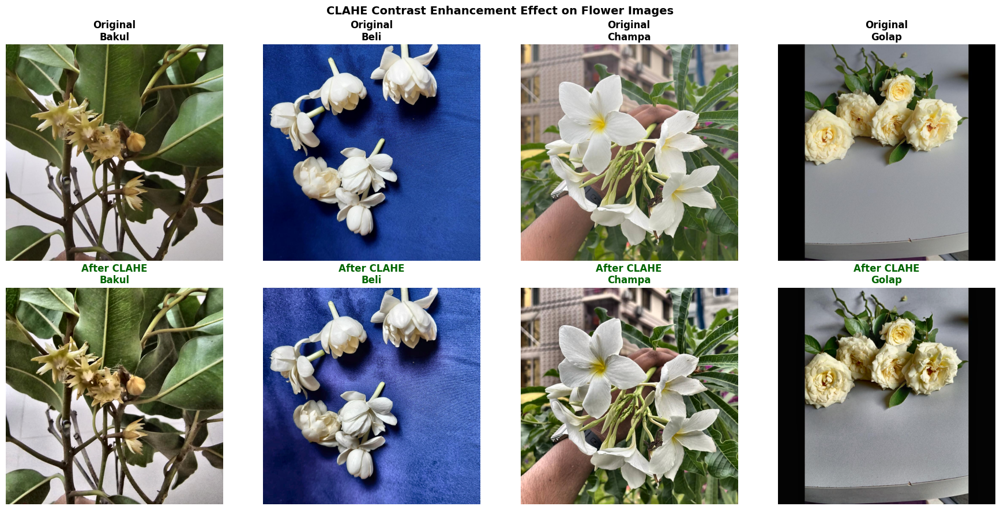

In [ ]:
def apply_clahe(img_array: np.ndarray) -> np.ndarray:
    """Apply CLAHE in LAB color space. Enhances local contrast without
    over-amplifying noise -- beneficial for flower texture detail."""
    lab = cv2.cvtColor(img_array, cv2.COLOR_RGB2LAB)
    l, a, b = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    cl = clahe.apply(l)
    enhanced_lab = cv2.merge((cl, a, b))
    enhanced_rgb = cv2.cvtColor(enhanced_lab, cv2.COLOR_LAB2RGB)
    return enhanced_rgb


class CLAHETransform:
    """Torchvision-compatible CLAHE transform."""
    def __call__(self, img):
        img_array = np.array(img)
        enhanced = apply_clahe(img_array)
        return Image.fromarray(enhanced)


# ---- Visualize CLAHE Effect ----
sample_paths = [df_clean[df_clean['label'] == cls].iloc[0]['path'] for cls in CLASS_NAMES[:4]]
fig, axes = plt.subplots(2, 4, figsize=(18, 9))
fig.suptitle('CLAHE Contrast Enhancement Effect on Flower Images', fontsize=14, fontweight='bold')

clahe_transform = CLAHETransform()
for i, path in enumerate(sample_paths):
    img = Image.open(path).convert('RGB')
    enhanced = clahe_transform(img)

    axes[0, i].imshow(img)
    axes[0, i].set_title(f'Original\n{CLASS_NAMES[i]}', fontweight='bold')
    axes[0, i].axis('off')

    axes[1, i].imshow(enhanced)
    axes[1, i].set_title(f'After CLAHE\n{CLASS_NAMES[i]}', fontweight='bold', color='darkgreen')
    axes[1, i].axis('off')

plt.tight_layout()
plt.savefig(OUT_DIR / 'figures' / 'clahe_comparison.png', dpi=300, bbox_inches='tight')
plt.show()


## Phase 5b: Dataset-Aligned Augmentation

The augmentation pipeline is restricted to exactly the 8 techniques below,
applied only to the **training** split on top of the resized image:

| # | Technique | Detail |
|---|-----------|--------|
| 1 | Horizontal Flip | mirror left-right |
| 2 | Vertical Flip | mirror top-bottom |
| 3 | Rotation 90° | rotate clockwise 90° |
| 4 | Rotation -90° | rotate counter-clockwise 90° |
| 5 | Brightness 30% Decreased | multiply pixel values by 0.70 |
| 6 | Brightness 30% Increased | multiply pixel values by 1.30 |
| 7 | 3 Pixel Blur | Gaussian blur, radius = 3 px |
| 8 | 2.5% Pixel Noise | Gaussian noise, std = 2.5% of the 0-255 range |

No other augmentation (no random-resized-crop, no color jitter, no
perspective/affine warps) is used.

**This notebook builds exactly ONE training transform and ONE eval transform**,
both driven by `USE_CLAHE` (True):
- Training transform: Resize -> augmentation -> CLAHE -> Normalize
- Validation/Test transform: Resize -> CLAHE -> Normalize (no augmentation)

Because train, validation, and test all read from the *same* `USE_CLAHE` flag,
CLAHE (or its absence) is applied consistently across every split — there is
no path in this notebook where one split gets CLAHE and another doesn't.

In [ ]:
# ── Augmentation transforms: ONLY the 8 techniques below ─────────
class BrightnessAdjust:
    """Multiplies pixel brightness by a fixed factor (0.70 = -30%, 1.30 = +30%)."""
    def __init__(self, factor: float):
        self.factor = factor
    def __call__(self, img):
        return ImageEnhance.Brightness(img).enhance(self.factor)


class PixelBlur:
    """Gaussian blur with a fixed pixel radius (default 3 px)."""
    def __init__(self, radius: int = 3):
        self.radius = radius
    def __call__(self, img):
        return img.filter(ImageFilter.GaussianBlur(radius=self.radius))


class PixelNoise:
    """Adds Gaussian noise whose std is a percentage of the 0-255 pixel range."""
    def __init__(self, pct: float = 2.5):
        self.pct = pct
    def __call__(self, img):
        arr = np.array(img).astype(np.float32)
        std = 255.0 * (self.pct / 100.0)
        noisy = arr + np.random.normal(0, std, arr.shape)
        return Image.fromarray(np.clip(noisy, 0, 255).astype(np.uint8))


class Rotate90:
    """Rotates by a fixed +90 or -90 degrees (no interpolation artifacts)."""
    def __init__(self, degrees: int):
        assert degrees in (90, -90)
        self.degrees = degrees
    def __call__(self, img):
        return img.rotate(self.degrees, expand=True).resize(img.size)


AUG_P_FLIP       = 0.5   # Horizontal / Vertical flip
AUG_P_ROTATE     = 0.3   # Rotation +90 / -90 (one or the other)
AUG_P_BRIGHTNESS = 0.3   # Brightness -30% / +30% (one or the other)
AUG_P_BLUR       = 0.15  # 3px blur
AUG_P_NOISE      = 0.15  # 2.5% pixel noise

def build_augmentation_ops():
    """Returns the list of the 8 allowed augmentation ops, applied independently."""
    return [
        transforms.RandomHorizontalFlip(p=AUG_P_FLIP),
        transforms.RandomVerticalFlip(p=AUG_P_FLIP),
        transforms.RandomApply([
            transforms.RandomChoice([Rotate90(90), Rotate90(-90)])
        ], p=AUG_P_ROTATE),
        transforms.RandomApply([
            transforms.RandomChoice([BrightnessAdjust(0.70), BrightnessAdjust(1.30)])
        ], p=AUG_P_BRIGHTNESS),
        transforms.RandomApply([PixelBlur(radius=3)], p=AUG_P_BLUR),
        transforms.RandomApply([PixelNoise(pct=2.5)], p=AUG_P_NOISE),
    ]


def build_train_transform(with_clahe: bool, with_augmentation: bool = True):
    """Single source of truth for the TRAIN transform. Augmentation (if any)
    runs first, CLAHE (if enabled) runs last, on top of the augmented image."""
    ops = [transforms.Resize((IMG_SIZE, IMG_SIZE))]
    if with_augmentation:
        ops += build_augmentation_ops()
    if with_clahe:
        ops.append(CLAHETransform())
    ops += [transforms.ToTensor(), transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD)]
    return transforms.Compose(ops)


def build_eval_transform(with_clahe: bool):
    """Single source of truth for the VALIDATION/TEST transform (no augmentation)."""
    ops = [transforms.Resize((IMG_SIZE, IMG_SIZE))]
    if with_clahe:
        ops.append(CLAHETransform())
    ops += [transforms.ToTensor(), transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD)]
    return transforms.Compose(ops)


# The ONE training transform and ONE eval transform used throughout this notebook.
# Every loader below (train, val, test, scheduler-comparison, main training,
# ablation) is built from these two objects, so preprocessing can never drift
# between splits or experiments.
train_transform = build_train_transform(with_clahe=USE_CLAHE, with_augmentation=True)
eval_transform  = build_eval_transform(with_clahe=USE_CLAHE)

print(f'USE_CLAHE={USE_CLAHE} -> train_transform and eval_transform built consistently.')
print(train_transform)


USE_CLAHE=True -> train_transform and eval_transform built consistently.
Compose(
    Resize(size=(224, 224), interpolation=bilinear, max_size=None, antialias=True)
    RandomHorizontalFlip(p=0.5)
    RandomVerticalFlip(p=0.5)
    RandomApply(
    p=0.3
    RandomChoice(
)(p=None)
)
    RandomApply(
    p=0.3
    RandomChoice(
)(p=None)
)
    RandomApply(
    p=0.15
)
    RandomApply(
    p=0.15
)
    ToTensor()
    Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
)


In [ ]:
# ---- Visualize the 8 Allowed Augmentation Techniques ----
demo_path = df_clean.iloc[0]['path']
demo_img = Image.open(demo_path).convert('RGB').resize((IMG_SIZE, IMG_SIZE))

flip_h   = transforms.functional.hflip(demo_img)
flip_v   = transforms.functional.vflip(demo_img)
rot_90   = Rotate90(90)(demo_img)
rot_n90  = Rotate90(-90)(demo_img)
bright_d = BrightnessAdjust(0.70)(demo_img)
bright_i = BrightnessAdjust(1.30)(demo_img)
blur_3   = PixelBlur(radius=3)(demo_img)
noise_25 = PixelNoise(pct=2.5)(demo_img)

# fig = plt.figure(figsize=(14, 14))
# fig.suptitle('Original Image', fontsize=14, fontweight='bold', y=0.99)
# gs = gridspec.GridSpec(5, 4, figure=fig, hspace=0.5, wspace=0.15)

# ax0 = fig.add_subplot(gs[0, 1:3])
# ax0.imshow(demo_img); ax0.axis('off')

# def show(ax, img, label):
#     ax.imshow(img); ax.axis('off')
#     ax.set_title(label, fontsize=10, fontweight='bold',
#                  bbox=dict(boxstyle='round', facecolor='#cfe9ff', edgecolor='none'))

# show(fig.add_subplot(gs[1, 0]), flip_h, 'Horizontal')
# show(fig.add_subplot(gs[1, 1]), flip_v, 'Vertical')
# show(fig.add_subplot(gs[1, 2]), rot_90, '90°')
# show(fig.add_subplot(gs[1, 3]), rot_n90, '-90°')

# show(fig.add_subplot(gs[2, 0]), bright_d, '30% Decreased')
# show(fig.add_subplot(gs[2, 1]), bright_i, '30% Increased')
# show(fig.add_subplot(gs[2, 2]), blur_3, '3 pixel Blur')
# show(fig.add_subplot(gs[2, 3]), noise_25, '2.5% pixel Noise')

# plt.savefig(OUT_DIR / 'figures' / 'augmentation_demo.png', dpi=300, bbox_inches='tight')
# plt.show()


## Phase 6: Dataset & DataLoader Classes

One train/val/test loader triplet, built from the single `train_transform` / `eval_transform` pair defined above — the same preprocessing choice is applied to every split.

In [ ]:
class FlowerDataset(Dataset):
    def __init__(self, paths, labels, transform=None):
        self.paths = paths; self.labels = labels; self.transform = transform
    def __len__(self): return len(self.paths)
    def __getitem__(self, idx):
        try:
            img = Image.open(self.paths[idx]).convert('RGB')
        except Exception:
            img = Image.new('RGB', (IMG_SIZE, IMG_SIZE), (128, 128, 128))
        if self.transform: img = self.transform(img)
        return img, self.labels[idx]


train_loader = DataLoader(
    FlowerDataset(X_train, y_train, train_transform),
    batch_size=BATCH_SIZE, shuffle=True, num_workers=NUM_WORKERS, pin_memory=True)
val_loader = DataLoader(
    FlowerDataset(X_val, y_val, eval_transform),
    batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)
test_loader = DataLoader(
    FlowerDataset(X_test, y_test, eval_transform),
    batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)

print(f'Train batches: {len(train_loader)} | Val: {len(val_loader)} | Test: {len(test_loader)}')
print(f'Preprocessing: USE_CLAHE={USE_CLAHE} applied identically to train/val/test.')


Train batches: 68 | Val: 23 | Test: 23
Preprocessing: USE_CLAHE=True applied identically to train/val/test.


## Phase 7: Model Definitions (ResNet50, DenseNet121, EfficientNet-B0, ConvNeXt-Tiny)

In [ ]:
def build_resnet50(num_classes: int, pretrained: bool = True) -> nn.Module:
    """ResNet-50 with custom classification head."""
    model = models.resnet50(weights=models.ResNet50_Weights.IMAGENET1K_V2 if pretrained else None)
    in_features = model.fc.in_features
    model.fc = nn.Sequential(
        nn.Dropout(p=0.4),
        nn.Linear(in_features, 512),
        nn.BatchNorm1d(512),
        nn.ReLU(inplace=True),
        nn.Dropout(p=0.3),
        nn.Linear(512, num_classes)
    )
    return model


def build_densenet121(num_classes: int, pretrained: bool = True) -> nn.Module:
    """DenseNet-121 with custom classification head."""
    model = models.densenet121(weights=models.DenseNet121_Weights.IMAGENET1K_V1 if pretrained else None)
    in_features = model.classifier.in_features
    model.classifier = nn.Sequential(
        nn.Dropout(p=0.4),
        nn.Linear(in_features, 512),
        nn.BatchNorm1d(512),
        nn.ReLU(inplace=True),
        nn.Dropout(p=0.3),
        nn.Linear(512, num_classes)
    )
    return model


def build_efficientnet_b0(num_classes: int, pretrained: bool = True) -> nn.Module:
    """EfficientNet-B0 with custom classification head."""
    model = models.efficientnet_b0(weights=models.EfficientNet_B0_Weights.IMAGENET1K_V1 if pretrained else None)
    in_features = model.classifier[1].in_features
    model.classifier = nn.Sequential(
        nn.Dropout(p=0.4),
        nn.Linear(in_features, 512),
        nn.BatchNorm1d(512),
        nn.ReLU(inplace=True),
        nn.Dropout(p=0.3),
        nn.Linear(512, num_classes)
    )
    return model


def build_convnext_tiny(num_classes: int, pretrained: bool = True) -> nn.Module:
    """ConvNeXt-Tiny with custom head."""
    model = timm.create_model('convnext_tiny', pretrained=pretrained, num_classes=0)
    in_features = model.num_features
    head = nn.Sequential(
        nn.AdaptiveAvgPool2d(1),
        nn.Flatten(),
        nn.Dropout(p=0.4),
        nn.Linear(in_features, 512),
        nn.BatchNorm1d(512),
        nn.GELU(),
        nn.Dropout(p=0.3),
        nn.Linear(512, num_classes)
    )
    model.head = head
    return model


def count_parameters(model):
    total = sum(p.numel() for p in model.parameters())
    trainable = sum(p.numel() for p in model.parameters() if p.requires_grad)
    return total, trainable


model_configs = {
    'ResNet50':       build_resnet50(NUM_CLASSES),
    'DenseNet121':    build_densenet121(NUM_CLASSES),
    'EfficientNetB0': build_efficientnet_b0(NUM_CLASSES),
    'ConvNeXtTiny':   build_convnext_tiny(NUM_CLASSES),
}

print(f'{"Model":<20} {"Total Params":>15} {"Trainable Params":>18}')
print('-' * 56)
for name, m in model_configs.items():
    total, trainable = count_parameters(m)
    print(f'{name:<20} {total:>15,} {trainable:>18,}')
del model_configs


Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth


100%|██████████| 97.8M/97.8M [00:00<00:00, 176MB/s]


Downloading: "https://download.pytorch.org/models/densenet121-a639ec97.pth" to /root/.cache/torch/hub/checkpoints/densenet121-a639ec97.pth


100%|██████████| 30.8M/30.8M [00:00<00:00, 134MB/s]


Downloading: "https://download.pytorch.org/models/efficientnet_b0_rwightman-7f5810bc.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b0_rwightman-7f5810bc.pth


100%|██████████| 20.5M/20.5M [00:00<00:00, 133MB/s]


model.safetensors: reconstructing file:   0%|          |  0.00B /  114MB            

model.safetensors: downloading bytes:           |  0.00B            

Model                   Total Params   Trainable Params
--------------------------------------------------------
ResNet50                  24,564,300         24,564,300
DenseNet121                7,485,836          7,485,836
EfficientNetB0             4,670,600          4,670,600
ConvNeXtTiny              28,219,500         28,219,500


## Phase 8: Training Infrastructure

- `train_model()` accepts `scheduler_name` — supports all 4 schedulers via `build_scheduler()`
- `save_to_drive()` called automatically on every validation-loss improvement
- `EarlyStopping` tracks `best_epoch`, `best_val_acc`, `best_val_loss`
- `train_one_epoch()` handles OneCycleLR batch-level stepping correctly

In [ ]:
class EarlyStopping:
    def __init__(self, patience=7, min_delta=1e-4, save_path=None):
        self.patience = patience; self.min_delta = min_delta
        self.save_path = save_path; self.counter = 0
        self.best_score = self.best_state = None
        self.best_val_loss = self.best_val_acc = self.best_epoch = None
        self.early_stop = False

    def __call__(self, val_loss, val_acc, epoch, model):
        score = -val_loss
        if self.best_score is None or score > self.best_score + self.min_delta:
            self.best_score = score; self.counter = 0
            self.best_val_loss = val_loss; self.best_val_acc = val_acc
            self.best_epoch = epoch; self._save(model)
        else:
            self.counter += 1
            if self.counter >= self.patience: self.early_stop = True

    def _save(self, model):
        self.best_state = copy.deepcopy(model.state_dict())
        if self.save_path: torch.save(self.best_state, self.save_path)


def build_scheduler(name: str, optimizer, epochs: int, steps_per_epoch: int = 1):
    """
    Scheduler factory.
    CosineAnnealingLR : Smoothly decays LR to eta_min over T_max epochs. Best default.
    StepLR            : Drops by gamma every step_size=epochs//3 epochs. Simple baseline.
    ReduceLROnPlateau : Halves LR when val_loss stalls for 3 epochs. Adaptive.
    OneCycleLR        : Warm-up to max_lr=LR*10, then cosine decay. Super-convergence.
    """
    n = name.lower()
    if n == 'cosineannealinglr':
        return optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=epochs, eta_min=1e-6)
    elif n == 'steplr':
        return optim.lr_scheduler.StepLR(optimizer, step_size=max(1, epochs // 3), gamma=0.1)
    elif n == 'reducelronplateau':
        return optim.lr_scheduler.ReduceLROnPlateau(
            optimizer, mode='min', factor=0.5, patience=3, min_lr=1e-7)
    elif n == 'onecyclelr':
        return optim.lr_scheduler.OneCycleLR(
            optimizer, max_lr=LR * 10,
            total_steps=epochs * steps_per_epoch, pct_start=0.3, anneal_strategy='cos')
    else:
        raise ValueError(f'Unknown scheduler: {name}')


def train_one_epoch(model, loader, criterion, optimizer, scaler, scheduler, device,
                    is_onecycle=False):
    model.train()
    total_loss, correct, total = 0.0, 0, 0
    for imgs, labels in tqdm(loader, desc='Train', leave=False):
        imgs, labels = imgs.to(device), labels.to(device)
        optimizer.zero_grad()
        with torch.amp.autocast('cuda'):
            outputs = model(imgs); loss = criterion(outputs, labels)
        scaler.scale(loss).backward()
        scaler.unscale_(optimizer)
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
        scaler.step(optimizer); scaler.update()
        if is_onecycle: scheduler.step()
        total_loss += loss.item() * imgs.size(0)
        _, predicted = outputs.max(1)
        correct += predicted.eq(labels).sum().item(); total += imgs.size(0)
    return total_loss / total, 100.0 * correct / total


@torch.no_grad()
def evaluate(model, loader, criterion, device):
    model.eval()
    total_loss, correct, total = 0.0, 0, 0
    all_preds, all_probs, all_labels = [], [], []
    for imgs, labels in tqdm(loader, desc='Eval', leave=False):
        imgs, labels = imgs.to(device), labels.to(device)
        with torch.amp.autocast('cuda'):
            outputs = model(imgs); loss = criterion(outputs, labels)
        probs = F.softmax(outputs, dim=1); _, predicted = outputs.max(1)
        total_loss += loss.item() * imgs.size(0)
        correct += predicted.eq(labels).sum().item(); total += imgs.size(0)
        all_preds.extend(predicted.cpu().numpy())
        all_probs.extend(probs.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())
    return (total_loss / total, 100.0 * correct / total,
            np.array(all_preds), np.array(all_probs), np.array(all_labels))


def train_model(model, model_name: str, train_loader, val_loader, device,
                epochs=NUM_EPOCHS, lr=LR, weight_decay=WEIGHT_DECAY,
                patience=PATIENCE, scheduler_name='CosineAnnealingLR',
                class_weights=None):
    """
    Full training loop.
    scheduler_name : 'CosineAnnealingLR' | 'StepLR' | 'ReduceLROnPlateau' | 'OneCycleLR'
    class_weights  : optional torch.FloatTensor of per-class weights (inverse
                      class frequency, computed from the TRAIN split). Pass
                      None to train with a plain (unweighted) loss.
    Preprocessing (CLAHE or not) is entirely determined by which train_loader /
    val_loader is passed in -- this function does not toggle it, so the same
    consistent transform is used no matter which experiment calls it.
    """
    model = model.to(device)
    clahe_tag  = 'CLAHE' if USE_CLAHE else 'noCLAHE'
    run_tag    = f'{scheduler_name}_{clahe_tag}'
    local_path = OUT_DIR / 'models' / f'{model_name}_{run_tag}_best.pth'

    criterion = nn.CrossEntropyLoss(weight=class_weights, label_smoothing=0.1)
    optimizer = optim.AdamW(model.parameters(), lr=lr, weight_decay=weight_decay)
    is_onecycle = scheduler_name.lower() == 'onecyclelr'
    is_plateau  = scheduler_name.lower() == 'reducelronplateau'
    scheduler   = build_scheduler(scheduler_name, optimizer, epochs, len(train_loader))
    scaler      = torch.amp.GradScaler('cuda')
    es          = EarlyStopping(patience=patience, save_path=str(local_path))

    history = {'train_loss': [], 'train_acc': [], 'val_loss': [], 'val_acc': [], 'lr': []}
    prev_best_score = None
    start_time = time.time()

    print(f'\n{"="*65}')
    print(f'  Model: {model_name} | Scheduler: {scheduler_name} | CLAHE: {USE_CLAHE} | '
          f'Class-weighted loss: {class_weights is not None}')
    print(f'{"="*65}')

    for epoch in range(1, epochs + 1):
        train_loss, train_acc = train_one_epoch(
            model, train_loader, criterion, optimizer, scaler, scheduler, device, is_onecycle)
        val_loss, val_acc, _, _, _ = evaluate(model, val_loader, criterion, device)

        if not is_onecycle:
            scheduler.step(val_loss) if is_plateau else scheduler.step()

        current_lr = optimizer.param_groups[0]['lr']
        history['train_loss'].append(train_loss)
        history['train_acc'].append(train_acc)
        history['val_loss'].append(val_loss)
        history['val_acc'].append(val_acc)
        history['lr'].append(current_lr)

        print(f'Ep [{epoch:02d}/{epochs}] '
              f'TLoss:{train_loss:.4f} TAcc:{train_acc:.3f}% '
              f'VLoss:{val_loss:.4f} VAcc:{val_acc:.3f}% LR:{current_lr:.2e}')

        es(val_loss, val_acc, epoch, model)
        if es.best_score != prev_best_score:
            save_to_drive(model, model_name, run_tag, epoch, val_acc, val_loss)
            prev_best_score = es.best_score

        if es.early_stop:
            print(f'Early stopping at ep {epoch} (best@ep{es.best_epoch}, val_loss={es.best_val_loss:.4f})')
            break

    print(f'Training time: {(time.time()-start_time)/60:.1f} min')
    model.load_state_dict(es.best_state)
    return model, history


print('Training infrastructure ready.')


Training infrastructure ready.


## Phase 8b: Scheduler Comparison Experiment

Train **EfficientNetB0** with all 4 schedulers, using this notebook's single
`train_transform` / `eval_transform` pair (`USE_CLAHE=True`). The best
scheduler is then automatically selected for the full 4-model training run.

| Scheduler | Key Trait | Ideal Use Case |
|-----------|-----------|----------------|
| CosineAnnealingLR | Smooth decay, no monitoring | Default for most CNNs |
| StepLR | Discrete drops at fixed intervals | When rough schedule is fine |
| ReduceLROnPlateau | Adapts to val loss stagnation | Noisy training curves |
| OneCycleLR | Warm-up -> super-convergence | Fast training, fewer epochs |


In [ ]:
SCHEDULER_NAMES = ['OneCycleLR']
scheduler_results = {}  # {scheduler_name: history}
SCHED_EPOCHS = min(NUM_EPOCHS, 30)  # Limit epochs for comparison speed

print(f'Running scheduler comparison on EfficientNetB0 ({SCHED_EPOCHS} epochs each, USE_CLAHE={USE_CLAHE})...')
for sched_name in SCHEDULER_NAMES:
    torch.cuda.empty_cache()
    m = build_efficientnet_b0(NUM_CLASSES, pretrained=True)
    _, hist = train_model(
        m, 'EfficientNetB0', train_loader, val_loader, DEVICE,
        epochs=SCHED_EPOCHS, lr=LR, patience=PATIENCE,
        scheduler_name=sched_name,
        class_weights=class_weights)
    scheduler_results[sched_name] = hist
    del m; torch.cuda.empty_cache()

print('\nScheduler comparison complete!')


Running scheduler comparison on EfficientNetB0 (10 epochs each, USE_CLAHE=True)...

  Model: EfficientNetB0 | Scheduler: OneCycleLR | CLAHE: True | Class-weighted loss: True


Train:   0%|          | 0/68 [00:00<?, ?it/s]

KeyboardInterrupt: 

In [ ]:
# ── Plot scheduler comparison ─────────────────────────────────────
fig, axes = plt.subplots(1, 3, figsize=(22, 7))
fig.suptitle(f'LR Scheduler Comparison -- EfficientNetB0 (12-class, WITH CLAHE)\n'
             f'(each line = validation metric measured once per training epoch)',
             fontsize=15, fontweight='bold')
colors = ['#3498DB', '#E74C3C', '#2ECC71', '#F39C12']

for ax, (key, ylabel, title) in zip(axes, [
    ('val_acc',  'Val Accuracy (%)', 'Validation Accuracy'),
    ('val_loss', 'Val Loss',         'Validation Loss'),
    ('lr',       'Learning Rate',    'LR Schedule'),
]):
    for (sname, hist), clr in zip(scheduler_results.items(), colors):
        n_ep = len(hist[key])
        ax.plot(range(1, n_ep + 1), hist[key], label=sname, color=clr, lw=2.2,
                marker='o', markersize=4)
    ax.set_xlabel('Training Epoch', fontsize=13, fontweight='bold')
    ax.set_ylabel(ylabel, fontsize=13, fontweight='bold')
    ax.set_title(title, fontsize=14, fontweight='bold')
    ax.tick_params(axis='both', labelsize=11)
    max_ep = max(len(h[key]) for h in scheduler_results.values())
    ax.set_xticks(range(1, max_ep + 1))
    ax.legend(fontsize=11)
    ax.grid(alpha=0.3)

plt.tight_layout()
plt.savefig(OUT_DIR / 'figures' / 'scheduler_comparison.png', dpi=300, bbox_inches='tight')
plt.show()

sched_best_acc = {k: max(v['val_acc']) for k, v in scheduler_results.items()}
print('Best Val Acc per Scheduler:')
for k, v in sched_best_acc.items():
    ep = scheduler_results[k]['val_acc'].index(v) + 1
    print(f'  {k:<22}: {v:.3f}% (epoch {ep})')

BEST_SCHEDULER = max(sched_best_acc, key=sched_best_acc.get)
print(f'\nBEST_SCHEDULER = "{BEST_SCHEDULER}" ({sched_best_acc[BEST_SCHEDULER]:.3f}%)')
print('This will be used for the full 4-model training run.')


## Phase 9: Train All 4 Models

Uses `BEST_SCHEDULER` from Phase 8b. A single training run — all four models
share the same `train_loader` / `val_loader` built with `USE_CLAHE=True` — "
so preprocessing stays identical across models and across train/val/test.

In [ ]:
model_builders = {
    'ResNet50':       build_resnet50,
    'DenseNet121':    build_densenet121,
    'EfficientNetB0': build_efficientnet_b0,
    'ConvNeXtTiny':   build_convnext_tiny,
}
BEST_SCHEDULER="OneCycleLR"
print(f'=== Training all 4 models (USE_CLAHE={USE_CLAHE}) ===')
trained_models = {}; all_histories = {}
for model_name, builder in model_builders.items():
    torch.cuda.empty_cache()
    m = builder(NUM_CLASSES, pretrained=True)
    trained_m, hist = train_model(
        m, model_name, train_loader, val_loader, DEVICE,
        epochs=NUM_EPOCHS, scheduler_name=BEST_SCHEDULER,
        class_weights=class_weights)
    trained_models[model_name] = trained_m; all_histories[model_name] = hist
print('\nAll models trained.')


=== Training all 4 models (USE_CLAHE=True) ===

  Model: ResNet50 | Scheduler: OneCycleLR | CLAHE: True | Class-weighted loss: True


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [01/10] TLoss:1.8472 TAcc:48.845% VLoss:0.7338 VAcc:95.562% LR:2.82e-04
  -> Checkpoint saved to Drive & Local: ResNet50_OneCycleLR_CLAHE_ep01_acc95.56.pth


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [02/10] TLoss:0.7973 TAcc:92.606% VLoss:0.7223 VAcc:95.700% LR:7.64e-04
  -> Checkpoint saved to Drive & Local: ResNet50_OneCycleLR_CLAHE_ep02_acc95.70.pth


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [03/10] TLoss:0.8919 TAcc:89.233% VLoss:0.8930 VAcc:87.379% LR:1.00e-03


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [04/10] TLoss:0.8245 TAcc:90.989% VLoss:0.9017 VAcc:87.517% LR:9.49e-04


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [05/10] TLoss:0.7652 TAcc:93.623% VLoss:0.6763 VAcc:95.700% LR:8.09e-04
  -> Checkpoint saved to Drive & Local: ResNet50_OneCycleLR_CLAHE_ep05_acc95.70.pth


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [06/10] TLoss:0.6914 TAcc:96.442% VLoss:0.6306 VAcc:97.087% LR:6.08e-04
  -> Checkpoint saved to Drive & Local: ResNet50_OneCycleLR_CLAHE_ep06_acc97.09.pth


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [07/10] TLoss:0.6315 TAcc:98.198% VLoss:0.5909 VAcc:98.613% LR:3.86e-04
  -> Checkpoint saved to Drive & Local: ResNet50_OneCycleLR_CLAHE_ep07_acc98.61.pth


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [08/10] TLoss:0.6175 TAcc:98.521% VLoss:0.5747 VAcc:99.029% LR:1.86e-04
  -> Checkpoint saved to Drive & Local: ResNet50_OneCycleLR_CLAHE_ep08_acc99.03.pth


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [09/10] TLoss:0.5936 TAcc:99.168% VLoss:0.5723 VAcc:99.168% LR:4.81e-05
  -> Checkpoint saved to Drive & Local: ResNet50_OneCycleLR_CLAHE_ep09_acc99.17.pth


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [10/10] TLoss:0.5821 TAcc:99.584% VLoss:0.5715 VAcc:99.029% LR:1.49e-08
  -> Checkpoint saved to Drive & Local: ResNet50_OneCycleLR_CLAHE_ep10_acc99.03.pth
Training time: 15.0 min

  Model: DenseNet121 | Scheduler: OneCycleLR | CLAHE: True | Class-weighted loss: True


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [01/10] TLoss:1.9933 TAcc:43.392% VLoss:0.8379 VAcc:94.730% LR:2.82e-04
  -> Checkpoint saved to Drive & Local: DenseNet121_OneCycleLR_CLAHE_ep01_acc94.73.pth


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [02/10] TLoss:0.8778 TAcc:89.464% VLoss:1.2832 VAcc:67.961% LR:7.64e-04


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [03/10] TLoss:0.9069 TAcc:86.922% VLoss:1.2254 VAcc:78.086% LR:1.00e-03


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [04/10] TLoss:0.8861 TAcc:87.985% VLoss:0.7764 VAcc:91.817% LR:9.49e-04
  -> Checkpoint saved to Drive & Local: DenseNet121_OneCycleLR_CLAHE_ep04_acc91.82.pth


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [05/10] TLoss:0.8006 TAcc:92.190% VLoss:0.7460 VAcc:93.343% LR:8.09e-04
  -> Checkpoint saved to Drive & Local: DenseNet121_OneCycleLR_CLAHE_ep05_acc93.34.pth


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [06/10] TLoss:0.7146 TAcc:95.287% VLoss:0.6648 VAcc:96.394% LR:6.08e-04
  -> Checkpoint saved to Drive & Local: DenseNet121_OneCycleLR_CLAHE_ep06_acc96.39.pth


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [07/10] TLoss:0.6665 TAcc:97.135% VLoss:0.5922 VAcc:98.890% LR:3.86e-04
  -> Checkpoint saved to Drive & Local: DenseNet121_OneCycleLR_CLAHE_ep07_acc98.89.pth


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [08/10] TLoss:0.6258 TAcc:98.198% VLoss:0.5801 VAcc:99.168% LR:1.86e-04
  -> Checkpoint saved to Drive & Local: DenseNet121_OneCycleLR_CLAHE_ep08_acc99.17.pth


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [09/10] TLoss:0.6013 TAcc:99.307% VLoss:0.5764 VAcc:99.445% LR:4.81e-05
  -> Checkpoint saved to Drive & Local: DenseNet121_OneCycleLR_CLAHE_ep09_acc99.45.pth


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [10/10] TLoss:0.5969 TAcc:99.399% VLoss:0.5755 VAcc:99.307% LR:1.49e-08
  -> Checkpoint saved to Drive & Local: DenseNet121_OneCycleLR_CLAHE_ep10_acc99.31.pth
Training time: 8.9 min

  Model: EfficientNetB0 | Scheduler: OneCycleLR | CLAHE: True | Class-weighted loss: True


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [01/10] TLoss:2.0409 TAcc:39.556% VLoss:0.9866 VAcc:92.372% LR:2.82e-04
  -> Checkpoint saved to Drive & Local: EfficientNetB0_OneCycleLR_CLAHE_ep01_acc92.37.pth


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [02/10] TLoss:0.8731 TAcc:90.388% VLoss:0.6977 VAcc:95.562% LR:7.64e-04
  -> Checkpoint saved to Drive & Local: EfficientNetB0_OneCycleLR_CLAHE_ep02_acc95.56.pth


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [03/10] TLoss:0.8037 TAcc:91.543% VLoss:0.7147 VAcc:95.146% LR:1.00e-03


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [04/10] TLoss:0.7737 TAcc:93.022% VLoss:0.6592 VAcc:98.058% LR:9.49e-04
  -> Checkpoint saved to Drive & Local: EfficientNetB0_OneCycleLR_CLAHE_ep04_acc98.06.pth


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [05/10] TLoss:0.6849 TAcc:96.303% VLoss:0.6090 VAcc:98.474% LR:8.09e-04
  -> Checkpoint saved to Drive & Local: EfficientNetB0_OneCycleLR_CLAHE_ep05_acc98.47.pth


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [06/10] TLoss:0.6486 TAcc:97.551% VLoss:0.5975 VAcc:98.890% LR:6.08e-04
  -> Checkpoint saved to Drive & Local: EfficientNetB0_OneCycleLR_CLAHE_ep06_acc98.89.pth


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [07/10] TLoss:0.6403 TAcc:97.689% VLoss:0.5773 VAcc:99.445% LR:3.86e-04
  -> Checkpoint saved to Drive & Local: EfficientNetB0_OneCycleLR_CLAHE_ep07_acc99.45.pth


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [08/10] TLoss:0.5975 TAcc:98.937% VLoss:0.5644 VAcc:99.584% LR:1.86e-04
  -> Checkpoint saved to Drive & Local: EfficientNetB0_OneCycleLR_CLAHE_ep08_acc99.58.pth


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [09/10] TLoss:0.5842 TAcc:99.584% VLoss:0.5635 VAcc:99.584% LR:4.81e-05
  -> Checkpoint saved to Drive & Local: EfficientNetB0_OneCycleLR_CLAHE_ep09_acc99.58.pth


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [10/10] TLoss:0.5821 TAcc:99.584% VLoss:0.5636 VAcc:99.445% LR:1.49e-08
Training time: 8.5 min

  Model: ConvNeXtTiny | Scheduler: OneCycleLR | CLAHE: True | Class-weighted loss: True


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [01/10] TLoss:1.4125 TAcc:69.640% VLoss:0.7559 VAcc:94.175% LR:2.82e-04
  -> Checkpoint saved to Drive & Local: ConvNeXtTiny_OneCycleLR_CLAHE_ep01_acc94.17.pth


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [02/10] TLoss:0.8906 TAcc:87.616% VLoss:0.9878 VAcc:82.940% LR:7.64e-04


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [03/10] TLoss:1.1235 TAcc:77.911% VLoss:1.1802 VAcc:77.115% LR:1.00e-03


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [04/10] TLoss:1.1030 TAcc:78.604% VLoss:1.2411 VAcc:71.983% LR:9.49e-04


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [05/10] TLoss:0.9396 TAcc:85.351% VLoss:0.9680 VAcc:84.743% LR:8.09e-04


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [06/10] TLoss:0.8292 TAcc:90.804% VLoss:0.8331 VAcc:90.707% LR:6.08e-04


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [07/10] TLoss:0.7484 TAcc:94.501% VLoss:0.6949 VAcc:95.700% LR:3.86e-04
  -> Checkpoint saved to Drive & Local: ConvNeXtTiny_OneCycleLR_CLAHE_ep07_acc95.70.pth


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [08/10] TLoss:0.6609 TAcc:97.412% VLoss:0.6497 VAcc:96.255% LR:1.86e-04
  -> Checkpoint saved to Drive & Local: ConvNeXtTiny_OneCycleLR_CLAHE_ep08_acc96.26.pth


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [09/10] TLoss:0.6185 TAcc:98.799% VLoss:0.6054 VAcc:98.613% LR:4.81e-05
  -> Checkpoint saved to Drive & Local: ConvNeXtTiny_OneCycleLR_CLAHE_ep09_acc98.61.pth


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [10/10] TLoss:0.5979 TAcc:99.630% VLoss:0.6011 VAcc:98.336% LR:1.49e-08
  -> Checkpoint saved to Drive & Local: ConvNeXtTiny_OneCycleLR_CLAHE_ep10_acc98.34.pth
Training time: 9.0 min

All models trained.


## Phase 9b: Multi-Seed Robustness Check (All 4 Models)

Reviewer #3 (comment 2) and Reviewer #2 (comment 2) note that the very high
accuracy in Table I comes from a **single** 60/20/20 split and ask for
repeated experiments with multiple random seeds, stratified k-fold
cross-validation, or confidence intervals to show the result is not an
artefact of one favourable split/initialisation.

This version retrains **all four backbones** (not just the best one) from
scratch with `N_ROBUSTNESS_SEEDS` different random seeds each. To keep the
added compute (4 models &times; N seeds) tractable, each run uses a reduced
`ROBUSTNESS_EPOCHS` budget instead of the full `NUM_EPOCHS` used for the
Table I numbers. The train/validation/test partition itself is kept fixed
(identical to the rest of this notebook) so that this experiment isolates
variance coming from weight initialisation, augmentation sampling and batch
ordering -- exactly the kind of stochastic variance a single reported number
cannot rule out. We report test Accuracy, F1 and MCC as **mean +/- std**
across seeds together with a 95% confidence interval, per model, to be read
side-by-side with the single-split numbers in Table I.

**Two things to disclose if these numbers are reported in the paper:**
1. Because `ROBUSTNESS_EPOCHS` &lt; `NUM_EPOCHS`, these per-seed models are
   *not* trained to the same point as the Table I models -- treat the
   resulting mean/std as an approximate noise estimate, not as a
   drop-in replacement for the fully-trained Table I results.
2. The seed-to-seed standard deviation computed here is also reused in
   Phase 11c as a data-driven **non-inferiority margin** for testing
   whether CLAHE ever meaningfully *reduces* accuracy, rather than only
   testing for "any difference" as Phase 11b does.


In [ ]:
def compute_metrics_robust(y_true, y_pred, y_probs):
    '''Lightweight metrics helper (mirrors the fuller compute_metrics() used
    later in Phase 11) so the robustness check can run before that cell.'''
    y_probs = np.array(y_probs, dtype=np.float64)
    y_probs = y_probs / y_probs.sum(axis=1, keepdims=True)
    return {
        'accuracy': accuracy_score(y_true, y_pred),
        'f1': f1_score(y_true, y_pred, average='macro', zero_division=0),
        'mcc': matthews_corrcoef(y_true, y_pred),
    }


N_ROBUSTNESS_SEEDS = 3
ROBUSTNESS_SEEDS = [42, 123, 2024][:N_ROBUSTNESS_SEEDS]
ROBUSTNESS_EPOCHS = 10  # reduced budget so 4 models x N seeds stays tractable
_eval_criterion = nn.CrossEntropyLoss()

robustness_results = []
print(f'=== Multi-Seed Robustness Check: ALL 4 MODELS '
      f'({N_ROBUSTNESS_SEEDS} seeds x {ROBUSTNESS_EPOCHS} epochs, USE_CLAHE={USE_CLAHE}) ===')

for model_name, builder in model_builders.items():
    for seed in ROBUSTNESS_SEEDS:
        torch.cuda.empty_cache()
        random.seed(seed); np.random.seed(seed)
        torch.manual_seed(seed); torch.cuda.manual_seed_all(seed)

        m = builder(NUM_CLASSES, pretrained=True)
        trained_m, _ = train_model(
            m, f'{model_name}_seed{seed}', train_loader, val_loader, DEVICE,
            epochs=ROBUSTNESS_EPOCHS, scheduler_name=BEST_SCHEDULER,
            class_weights=class_weights)

        trained_m.eval()
        _, _, preds, probs, labels = evaluate(trained_m, test_loader, _eval_criterion, DEVICE)
        m_metrics = compute_metrics_robust(labels, preds, probs)
        robustness_results.append({'model': model_name, 'seed': seed, **m_metrics})
        print(f'  {model_name:<14s} seed={seed:<5d} -> Acc:{m_metrics["accuracy"]*100:.3f}%  '
              f'F1:{m_metrics["f1"]*100:.3f}%  MCC:{m_metrics["mcc"]:.4f}')
        del m, trained_m; torch.cuda.empty_cache()

# Restore the notebook-wide SEED for every subsequent cell
random.seed(SEED); np.random.seed(SEED)
torch.manual_seed(SEED); torch.cuda.manual_seed_all(SEED)

robust_df = pd.DataFrame(robustness_results)

def _mean_ci95(x):
    x = np.asarray(x, dtype=float)
    m = x.mean()
    s = x.std(ddof=1) if len(x) > 1 else 0.0
    half = 1.96 * s / np.sqrt(len(x)) if len(x) > 1 else 0.0
    return m, s, m - half, m + half

robustness_summary_rows = []
print(f'\n=== Robustness Summary Across {N_ROBUSTNESS_SEEDS} Seeds, '
      f'{ROBUSTNESS_EPOCHS} Epochs (USE_CLAHE={USE_CLAHE}) ===')
for model_name in model_builders:
    sub = robust_df[robust_df['model'] == model_name]
    row = {'model': model_name}
    for metric_key, label, scale in [('accuracy', 'Accuracy (%)', 100), ('f1', 'F1 (%)', 100), ('mcc', 'MCC', 1)]:
        m, s, lo, hi = _mean_ci95(sub[metric_key] * scale)
        row[f'{metric_key}_mean'] = m; row[f'{metric_key}_std'] = s
        row[f'{metric_key}_ci_lo'] = lo; row[f'{metric_key}_ci_hi'] = hi
        print(f'  {model_name:<14s} {label:<12}: {m:.3f} +/- {s:.3f}  (95% CI [{lo:.3f}, {hi:.3f}])')
    robustness_summary_rows.append(row)

robustness_summary_df = pd.DataFrame(robustness_summary_rows)
robust_df.to_csv(OUT_DIR / 'multi_seed_robustness_all_models.csv', index=False)
robustness_summary_df.to_csv(OUT_DIR / 'multi_seed_robustness_summary.csv', index=False)
print(f'\nSaved per-seed results -> {OUT_DIR / "multi_seed_robustness_all_models.csv"}')
print(f'Saved per-model summary -> {OUT_DIR / "multi_seed_robustness_summary.csv"}')
print('\nNote: ROBUSTNESS_EPOCHS is intentionally shorter than the main NUM_EPOCHS training '
      'run above, purely to keep 4 models x N seeds tractable. These seed-variance numbers are '
      'used only to characterise stochastic run-to-run noise (for the non-inferiority margin in '
      'Phase 11c) and should NOT be read as replacements for the main Table I results, which use '
      'the full training budget.')

# Cache this pipeline's seed-noise estimate so the companion notebook's Phase 11c
# can pool both pipelines' noise estimates for a more robust margin.
STAT_CACHE_DIR = Path('/content/drive/MyDrive/Aromatic Flower dataset/checkpoints/stat_significance_cache')
STAT_CACHE_DIR.mkdir(parents=True, exist_ok=True)
_PIPELINE_TAG = 'with_clahe' if USE_CLAHE else 'without_clahe'
with open(STAT_CACHE_DIR / f'robustness_summary_{_PIPELINE_TAG}.pkl', 'wb') as f:
    pickle.dump(dict(zip(robustness_summary_df['model'], robustness_summary_df['accuracy_std'])), f)
print(f'Cached seed-noise std -> {STAT_CACHE_DIR / f"robustness_summary_{_PIPELINE_TAG}.pkl"}')


=== Multi-Seed Robustness Check: ALL 4 MODELS (3 seeds x 10 epochs, USE_CLAHE=True) ===

  Model: ResNet50_seed42 | Scheduler: OneCycleLR | CLAHE: True | Class-weighted loss: True


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [01/10] TLoss:1.8490 TAcc:50.924% VLoss:0.7712 VAcc:93.897% LR:2.82e-04
  -> Checkpoint saved to Drive & Local: ResNet50_seed42_OneCycleLR_CLAHE_ep01_acc93.90.pth


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [02/10] TLoss:0.8102 TAcc:91.774% VLoss:0.8473 VAcc:89.459% LR:7.64e-04


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [03/10] TLoss:0.8857 TAcc:89.048% VLoss:1.1284 VAcc:81.137% LR:1.00e-03


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [04/10] TLoss:0.8303 TAcc:91.128% VLoss:0.8726 VAcc:89.182% LR:9.49e-04


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [05/10] TLoss:0.7759 TAcc:92.652% VLoss:0.6546 VAcc:97.781% LR:8.09e-04
  -> Checkpoint saved to Drive & Local: ResNet50_seed42_OneCycleLR_CLAHE_ep05_acc97.78.pth


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [06/10] TLoss:0.7179 TAcc:94.501% VLoss:0.6194 VAcc:98.890% LR:6.08e-04
  -> Checkpoint saved to Drive & Local: ResNet50_seed42_OneCycleLR_CLAHE_ep06_acc98.89.pth


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [07/10] TLoss:0.6587 TAcc:97.274% VLoss:0.5867 VAcc:99.168% LR:3.86e-04
  -> Checkpoint saved to Drive & Local: ResNet50_seed42_OneCycleLR_CLAHE_ep07_acc99.17.pth


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [08/10] TLoss:0.6226 TAcc:98.521% VLoss:0.5714 VAcc:99.445% LR:1.86e-04
  -> Checkpoint saved to Drive & Local: ResNet50_seed42_OneCycleLR_CLAHE_ep08_acc99.45.pth


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [09/10] TLoss:0.5963 TAcc:99.214% VLoss:0.5669 VAcc:99.445% LR:4.81e-05
  -> Checkpoint saved to Drive & Local: ResNet50_seed42_OneCycleLR_CLAHE_ep09_acc99.45.pth


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [10/10] TLoss:0.5860 TAcc:99.538% VLoss:0.5658 VAcc:99.445% LR:1.49e-08
  -> Checkpoint saved to Drive & Local: ResNet50_seed42_OneCycleLR_CLAHE_ep10_acc99.45.pth
Training time: 8.4 min


Eval:   0%|          | 0/23 [00:00<?, ?it/s]

  ResNet50       seed=42    -> Acc:99.723%  F1:99.664%  MCC:0.9970

  Model: ResNet50_seed123 | Scheduler: OneCycleLR | CLAHE: True | Class-weighted loss: True


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [01/10] TLoss:1.8615 TAcc:48.429% VLoss:0.7250 VAcc:96.533% LR:2.82e-04
  -> Checkpoint saved to Drive & Local: ResNet50_seed123_OneCycleLR_CLAHE_ep01_acc96.53.pth


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [02/10] TLoss:0.8014 TAcc:91.959% VLoss:0.7780 VAcc:91.540% LR:7.64e-04


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [03/10] TLoss:0.8792 TAcc:88.771% VLoss:0.8312 VAcc:88.211% LR:1.00e-03


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [04/10] TLoss:0.8378 TAcc:90.065% VLoss:0.7242 VAcc:96.255% LR:9.49e-04
  -> Checkpoint saved to Drive & Local: ResNet50_seed123_OneCycleLR_CLAHE_ep04_acc96.26.pth


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [05/10] TLoss:0.7660 TAcc:93.022% VLoss:0.7519 VAcc:93.204% LR:8.09e-04


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [06/10] TLoss:0.6827 TAcc:95.841% VLoss:0.6199 VAcc:98.474% LR:6.08e-04
  -> Checkpoint saved to Drive & Local: ResNet50_seed123_OneCycleLR_CLAHE_ep06_acc98.47.pth


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [07/10] TLoss:0.6415 TAcc:97.736% VLoss:0.5906 VAcc:98.752% LR:3.86e-04
  -> Checkpoint saved to Drive & Local: ResNet50_seed123_OneCycleLR_CLAHE_ep07_acc98.75.pth


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [08/10] TLoss:0.6183 TAcc:98.336% VLoss:0.5752 VAcc:99.307% LR:1.86e-04
  -> Checkpoint saved to Drive & Local: ResNet50_seed123_OneCycleLR_CLAHE_ep08_acc99.31.pth


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [09/10] TLoss:0.5928 TAcc:99.168% VLoss:0.5725 VAcc:99.445% LR:4.81e-05
  -> Checkpoint saved to Drive & Local: ResNet50_seed123_OneCycleLR_CLAHE_ep09_acc99.45.pth


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [10/10] TLoss:0.5936 TAcc:99.168% VLoss:0.5681 VAcc:99.445% LR:1.49e-08
  -> Checkpoint saved to Drive & Local: ResNet50_seed123_OneCycleLR_CLAHE_ep10_acc99.45.pth
Training time: 8.3 min


Eval:   0%|          | 0/23 [00:00<?, ?it/s]

  ResNet50       seed=123   -> Acc:99.584%  F1:99.395%  MCC:0.9955

  Model: ResNet50_seed2024 | Scheduler: OneCycleLR | CLAHE: True | Class-weighted loss: True


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [01/10] TLoss:1.9012 TAcc:45.471% VLoss:0.7673 VAcc:95.146% LR:2.82e-04
  -> Checkpoint saved to Drive & Local: ResNet50_seed2024_OneCycleLR_CLAHE_ep01_acc95.15.pth


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [02/10] TLoss:0.8077 TAcc:92.098% VLoss:1.5407 VAcc:68.239% LR:7.64e-04


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [03/10] TLoss:0.8711 TAcc:89.649% VLoss:0.8662 VAcc:88.488% LR:1.00e-03


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [04/10] TLoss:0.8364 TAcc:90.065% VLoss:0.7321 VAcc:94.036% LR:9.49e-04
  -> Checkpoint saved to Drive & Local: ResNet50_seed2024_OneCycleLR_CLAHE_ep04_acc94.04.pth


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [05/10] TLoss:0.7624 TAcc:93.022% VLoss:0.6719 VAcc:96.671% LR:8.09e-04
  -> Checkpoint saved to Drive & Local: ResNet50_seed2024_OneCycleLR_CLAHE_ep05_acc96.67.pth


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [06/10] TLoss:0.6875 TAcc:96.026% VLoss:0.6088 VAcc:98.474% LR:6.08e-04
  -> Checkpoint saved to Drive & Local: ResNet50_seed2024_OneCycleLR_CLAHE_ep06_acc98.47.pth


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [07/10] TLoss:0.6480 TAcc:97.551% VLoss:0.5861 VAcc:98.752% LR:3.86e-04
  -> Checkpoint saved to Drive & Local: ResNet50_seed2024_OneCycleLR_CLAHE_ep07_acc98.75.pth


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [08/10] TLoss:0.6109 TAcc:98.614% VLoss:0.5796 VAcc:99.307% LR:1.86e-04
  -> Checkpoint saved to Drive & Local: ResNet50_seed2024_OneCycleLR_CLAHE_ep08_acc99.31.pth


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [09/10] TLoss:0.5871 TAcc:99.584% VLoss:0.5764 VAcc:99.168% LR:4.81e-05
  -> Checkpoint saved to Drive & Local: ResNet50_seed2024_OneCycleLR_CLAHE_ep09_acc99.17.pth


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [10/10] TLoss:0.5911 TAcc:99.261% VLoss:0.5747 VAcc:99.029% LR:1.49e-08
  -> Checkpoint saved to Drive & Local: ResNet50_seed2024_OneCycleLR_CLAHE_ep10_acc99.03.pth
Training time: 8.4 min


Eval:   0%|          | 0/23 [00:00<?, ?it/s]

  ResNet50       seed=2024  -> Acc:99.446%  F1:99.285%  MCC:0.9939

  Model: DenseNet121_seed42 | Scheduler: OneCycleLR | CLAHE: True | Class-weighted loss: True


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [01/10] TLoss:2.0096 TAcc:42.375% VLoss:0.8452 VAcc:93.204% LR:2.82e-04
  -> Checkpoint saved to Drive & Local: DenseNet121_seed42_OneCycleLR_CLAHE_ep01_acc93.20.pth


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [02/10] TLoss:0.8813 TAcc:89.418% VLoss:0.8342 VAcc:90.430% LR:7.64e-04
  -> Checkpoint saved to Drive & Local: DenseNet121_seed42_OneCycleLR_CLAHE_ep02_acc90.43.pth


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [03/10] TLoss:0.9328 TAcc:86.506% VLoss:0.9438 VAcc:84.743% LR:1.00e-03


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [04/10] TLoss:0.8807 TAcc:89.002% VLoss:0.9276 VAcc:88.627% LR:9.49e-04


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [05/10] TLoss:0.8000 TAcc:91.266% VLoss:0.6885 VAcc:95.562% LR:8.09e-04
  -> Checkpoint saved to Drive & Local: DenseNet121_seed42_OneCycleLR_CLAHE_ep05_acc95.56.pth


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [06/10] TLoss:0.7390 TAcc:94.085% VLoss:0.6544 VAcc:97.503% LR:6.08e-04
  -> Checkpoint saved to Drive & Local: DenseNet121_seed42_OneCycleLR_CLAHE_ep06_acc97.50.pth


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [07/10] TLoss:0.6630 TAcc:97.320% VLoss:0.6011 VAcc:98.752% LR:3.86e-04
  -> Checkpoint saved to Drive & Local: DenseNet121_seed42_OneCycleLR_CLAHE_ep07_acc98.75.pth


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [08/10] TLoss:0.6290 TAcc:98.336% VLoss:0.5785 VAcc:99.445% LR:1.86e-04
  -> Checkpoint saved to Drive & Local: DenseNet121_seed42_OneCycleLR_CLAHE_ep08_acc99.45.pth


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [09/10] TLoss:0.6015 TAcc:98.983% VLoss:0.5735 VAcc:99.584% LR:4.81e-05
  -> Checkpoint saved to Drive & Local: DenseNet121_seed42_OneCycleLR_CLAHE_ep09_acc99.58.pth


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [10/10] TLoss:0.5985 TAcc:99.538% VLoss:0.5733 VAcc:99.445% LR:1.49e-08
  -> Checkpoint saved to Drive & Local: DenseNet121_seed42_OneCycleLR_CLAHE_ep10_acc99.45.pth
Training time: 8.7 min


Eval:   0%|          | 0/23 [00:00<?, ?it/s]

  DenseNet121    seed=42    -> Acc:99.861%  F1:99.877%  MCC:0.9985

  Model: DenseNet121_seed123 | Scheduler: OneCycleLR | CLAHE: True | Class-weighted loss: True


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [01/10] TLoss:1.9620 TAcc:42.791% VLoss:0.8947 VAcc:92.094% LR:2.82e-04
  -> Checkpoint saved to Drive & Local: DenseNet121_seed123_OneCycleLR_CLAHE_ep01_acc92.09.pth


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [02/10] TLoss:0.8558 TAcc:90.804% VLoss:1.2698 VAcc:71.151% LR:7.64e-04


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [03/10] TLoss:0.9116 TAcc:87.523% VLoss:1.6886 VAcc:56.588% LR:1.00e-03


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [04/10] TLoss:0.8935 TAcc:87.893% VLoss:0.8681 VAcc:88.072% LR:9.49e-04
  -> Checkpoint saved to Drive & Local: DenseNet121_seed123_OneCycleLR_CLAHE_ep04_acc88.07.pth


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [05/10] TLoss:0.8060 TAcc:91.359% VLoss:0.7032 VAcc:95.146% LR:8.09e-04
  -> Checkpoint saved to Drive & Local: DenseNet121_seed123_OneCycleLR_CLAHE_ep05_acc95.15.pth


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [06/10] TLoss:0.7278 TAcc:94.547% VLoss:0.6323 VAcc:98.336% LR:6.08e-04
  -> Checkpoint saved to Drive & Local: DenseNet121_seed123_OneCycleLR_CLAHE_ep06_acc98.34.pth


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [07/10] TLoss:0.6719 TAcc:96.858% VLoss:0.6000 VAcc:98.890% LR:3.86e-04
  -> Checkpoint saved to Drive & Local: DenseNet121_seed123_OneCycleLR_CLAHE_ep07_acc98.89.pth


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [08/10] TLoss:0.6316 TAcc:98.013% VLoss:0.5786 VAcc:99.307% LR:1.86e-04
  -> Checkpoint saved to Drive & Local: DenseNet121_seed123_OneCycleLR_CLAHE_ep08_acc99.31.pth


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [09/10] TLoss:0.6147 TAcc:98.567% VLoss:0.5675 VAcc:99.861% LR:4.81e-05
  -> Checkpoint saved to Drive & Local: DenseNet121_seed123_OneCycleLR_CLAHE_ep09_acc99.86.pth


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [10/10] TLoss:0.5991 TAcc:99.122% VLoss:0.5676 VAcc:99.584% LR:1.49e-08
Training time: 8.7 min


Eval:   0%|          | 0/23 [00:00<?, ?it/s]

  DenseNet121    seed=123   -> Acc:99.169%  F1:99.033%  MCC:0.9909

  Model: DenseNet121_seed2024 | Scheduler: OneCycleLR | CLAHE: True | Class-weighted loss: True


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [01/10] TLoss:1.9775 TAcc:44.085% VLoss:0.8332 VAcc:93.897% LR:2.82e-04
  -> Checkpoint saved to Drive & Local: DenseNet121_seed2024_OneCycleLR_CLAHE_ep01_acc93.90.pth


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [02/10] TLoss:0.8817 TAcc:89.233% VLoss:0.8479 VAcc:90.569% LR:7.64e-04


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [03/10] TLoss:0.9084 TAcc:88.170% VLoss:0.8447 VAcc:90.985% LR:1.00e-03


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [04/10] TLoss:0.8771 TAcc:89.233% VLoss:0.9384 VAcc:85.298% LR:9.49e-04


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [05/10] TLoss:0.7900 TAcc:92.144% VLoss:0.6642 VAcc:97.226% LR:8.09e-04
  -> Checkpoint saved to Drive & Local: DenseNet121_seed2024_OneCycleLR_CLAHE_ep05_acc97.23.pth


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [06/10] TLoss:0.7315 TAcc:94.177% VLoss:0.6244 VAcc:97.920% LR:6.08e-04
  -> Checkpoint saved to Drive & Local: DenseNet121_seed2024_OneCycleLR_CLAHE_ep06_acc97.92.pth


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [07/10] TLoss:0.6566 TAcc:97.458% VLoss:0.5907 VAcc:98.613% LR:3.86e-04
  -> Checkpoint saved to Drive & Local: DenseNet121_seed2024_OneCycleLR_CLAHE_ep07_acc98.61.pth


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [08/10] TLoss:0.6275 TAcc:98.013% VLoss:0.5791 VAcc:99.307% LR:1.86e-04
  -> Checkpoint saved to Drive & Local: DenseNet121_seed2024_OneCycleLR_CLAHE_ep08_acc99.31.pth


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [09/10] TLoss:0.6081 TAcc:98.891% VLoss:0.5703 VAcc:99.445% LR:4.81e-05
  -> Checkpoint saved to Drive & Local: DenseNet121_seed2024_OneCycleLR_CLAHE_ep09_acc99.45.pth


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [10/10] TLoss:0.5942 TAcc:99.677% VLoss:0.5695 VAcc:99.445% LR:1.49e-08
  -> Checkpoint saved to Drive & Local: DenseNet121_seed2024_OneCycleLR_CLAHE_ep10_acc99.45.pth
Training time: 8.6 min


Eval:   0%|          | 0/23 [00:00<?, ?it/s]

  DenseNet121    seed=2024  -> Acc:99.861%  F1:99.877%  MCC:0.9985

  Model: EfficientNetB0_seed42 | Scheduler: OneCycleLR | CLAHE: True | Class-weighted loss: True


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [01/10] TLoss:2.0363 TAcc:38.540% VLoss:0.9369 VAcc:91.817% LR:2.82e-04
  -> Checkpoint saved to Drive & Local: EfficientNetB0_seed42_OneCycleLR_CLAHE_ep01_acc91.82.pth


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [02/10] TLoss:0.8779 TAcc:89.649% VLoss:0.6526 VAcc:98.197% LR:7.64e-04
  -> Checkpoint saved to Drive & Local: EfficientNetB0_seed42_OneCycleLR_CLAHE_ep02_acc98.20.pth


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [03/10] TLoss:0.7704 TAcc:93.484% VLoss:0.6674 VAcc:96.810% LR:1.00e-03


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [04/10] TLoss:0.7662 TAcc:93.115% VLoss:0.6753 VAcc:97.781% LR:9.49e-04


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [05/10] TLoss:0.7126 TAcc:95.102% VLoss:0.6246 VAcc:97.642% LR:8.09e-04
  -> Checkpoint saved to Drive & Local: EfficientNetB0_seed42_OneCycleLR_CLAHE_ep05_acc97.64.pth


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [06/10] TLoss:0.6728 TAcc:96.534% VLoss:0.6043 VAcc:98.336% LR:6.08e-04
  -> Checkpoint saved to Drive & Local: EfficientNetB0_seed42_OneCycleLR_CLAHE_ep06_acc98.34.pth


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [07/10] TLoss:0.6173 TAcc:98.198% VLoss:0.5777 VAcc:99.168% LR:3.86e-04
  -> Checkpoint saved to Drive & Local: EfficientNetB0_seed42_OneCycleLR_CLAHE_ep07_acc99.17.pth


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [08/10] TLoss:0.6007 TAcc:99.122% VLoss:0.5661 VAcc:99.584% LR:1.86e-04
  -> Checkpoint saved to Drive & Local: EfficientNetB0_seed42_OneCycleLR_CLAHE_ep08_acc99.58.pth


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [09/10] TLoss:0.5901 TAcc:99.214% VLoss:0.5653 VAcc:99.584% LR:4.81e-05
  -> Checkpoint saved to Drive & Local: EfficientNetB0_seed42_OneCycleLR_CLAHE_ep09_acc99.58.pth


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [10/10] TLoss:0.5868 TAcc:99.492% VLoss:0.5649 VAcc:99.584% LR:1.49e-08
  -> Checkpoint saved to Drive & Local: EfficientNetB0_seed42_OneCycleLR_CLAHE_ep10_acc99.58.pth
Training time: 8.2 min


Eval:   0%|          | 0/23 [00:00<?, ?it/s]

  EfficientNetB0 seed=42    -> Acc:100.000%  F1:100.000%  MCC:1.0000

  Model: EfficientNetB0_seed123 | Scheduler: OneCycleLR | CLAHE: True | Class-weighted loss: True


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [01/10] TLoss:2.0384 TAcc:38.586% VLoss:0.9467 VAcc:90.985% LR:2.82e-04
  -> Checkpoint saved to Drive & Local: EfficientNetB0_seed123_OneCycleLR_CLAHE_ep01_acc90.98.pth


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [02/10] TLoss:0.8834 TAcc:89.325% VLoss:0.6847 VAcc:97.781% LR:7.64e-04
  -> Checkpoint saved to Drive & Local: EfficientNetB0_seed123_OneCycleLR_CLAHE_ep02_acc97.78.pth


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [03/10] TLoss:0.7939 TAcc:92.283% VLoss:0.7287 VAcc:95.839% LR:1.00e-03


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [04/10] TLoss:0.7550 TAcc:93.299% VLoss:0.6273 VAcc:98.336% LR:9.49e-04
  -> Checkpoint saved to Drive & Local: EfficientNetB0_seed123_OneCycleLR_CLAHE_ep04_acc98.34.pth


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [05/10] TLoss:0.6969 TAcc:95.518% VLoss:0.6157 VAcc:98.197% LR:8.09e-04
  -> Checkpoint saved to Drive & Local: EfficientNetB0_seed123_OneCycleLR_CLAHE_ep05_acc98.20.pth


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [06/10] TLoss:0.6393 TAcc:97.597% VLoss:0.5960 VAcc:99.168% LR:6.08e-04
  -> Checkpoint saved to Drive & Local: EfficientNetB0_seed123_OneCycleLR_CLAHE_ep06_acc99.17.pth


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [07/10] TLoss:0.6238 TAcc:98.198% VLoss:0.5755 VAcc:99.445% LR:3.86e-04
  -> Checkpoint saved to Drive & Local: EfficientNetB0_seed123_OneCycleLR_CLAHE_ep07_acc99.45.pth


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [08/10] TLoss:0.6022 TAcc:98.660% VLoss:0.5616 VAcc:99.723% LR:1.86e-04
  -> Checkpoint saved to Drive & Local: EfficientNetB0_seed123_OneCycleLR_CLAHE_ep08_acc99.72.pth


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [09/10] TLoss:0.5904 TAcc:99.214% VLoss:0.5597 VAcc:99.723% LR:4.81e-05
  -> Checkpoint saved to Drive & Local: EfficientNetB0_seed123_OneCycleLR_CLAHE_ep09_acc99.72.pth


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [10/10] TLoss:0.5876 TAcc:99.214% VLoss:0.5595 VAcc:99.723% LR:1.49e-08
  -> Checkpoint saved to Drive & Local: EfficientNetB0_seed123_OneCycleLR_CLAHE_ep10_acc99.72.pth
Training time: 8.4 min


Eval:   0%|          | 0/23 [00:00<?, ?it/s]

  EfficientNetB0 seed=123   -> Acc:99.861%  F1:99.876%  MCC:0.9985

  Model: EfficientNetB0_seed2024 | Scheduler: OneCycleLR | CLAHE: True | Class-weighted loss: True


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [01/10] TLoss:2.0295 TAcc:38.355% VLoss:0.9600 VAcc:90.707% LR:2.82e-04
  -> Checkpoint saved to Drive & Local: EfficientNetB0_seed2024_OneCycleLR_CLAHE_ep01_acc90.71.pth


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [02/10] TLoss:0.8814 TAcc:89.603% VLoss:0.6806 VAcc:97.781% LR:7.64e-04
  -> Checkpoint saved to Drive & Local: EfficientNetB0_seed2024_OneCycleLR_CLAHE_ep02_acc97.78.pth


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [03/10] TLoss:0.7961 TAcc:91.821% VLoss:0.7041 VAcc:96.117% LR:1.00e-03


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [04/10] TLoss:0.7802 TAcc:92.976% VLoss:0.6353 VAcc:98.197% LR:9.49e-04
  -> Checkpoint saved to Drive & Local: EfficientNetB0_seed2024_OneCycleLR_CLAHE_ep04_acc98.20.pth


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [05/10] TLoss:0.6981 TAcc:95.933% VLoss:0.6099 VAcc:99.168% LR:8.09e-04
  -> Checkpoint saved to Drive & Local: EfficientNetB0_seed2024_OneCycleLR_CLAHE_ep05_acc99.17.pth


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [06/10] TLoss:0.6594 TAcc:96.719% VLoss:0.5915 VAcc:98.752% LR:6.08e-04
  -> Checkpoint saved to Drive & Local: EfficientNetB0_seed2024_OneCycleLR_CLAHE_ep06_acc98.75.pth


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [07/10] TLoss:0.6231 TAcc:98.383% VLoss:0.5781 VAcc:99.168% LR:3.86e-04
  -> Checkpoint saved to Drive & Local: EfficientNetB0_seed2024_OneCycleLR_CLAHE_ep07_acc99.17.pth


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [08/10] TLoss:0.5971 TAcc:99.122% VLoss:0.5656 VAcc:99.445% LR:1.86e-04
  -> Checkpoint saved to Drive & Local: EfficientNetB0_seed2024_OneCycleLR_CLAHE_ep08_acc99.45.pth


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [09/10] TLoss:0.5878 TAcc:99.492% VLoss:0.5619 VAcc:99.445% LR:4.81e-05
  -> Checkpoint saved to Drive & Local: EfficientNetB0_seed2024_OneCycleLR_CLAHE_ep09_acc99.45.pth


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [10/10] TLoss:0.5933 TAcc:99.168% VLoss:0.5608 VAcc:99.584% LR:1.49e-08
  -> Checkpoint saved to Drive & Local: EfficientNetB0_seed2024_OneCycleLR_CLAHE_ep10_acc99.58.pth
Training time: 8.4 min


Eval:   0%|          | 0/23 [00:00<?, ?it/s]

  EfficientNetB0 seed=2024  -> Acc:99.861%  F1:99.882%  MCC:0.9985

  Model: ConvNeXtTiny_seed42 | Scheduler: OneCycleLR | CLAHE: True | Class-weighted loss: True


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [01/10] TLoss:1.4136 TAcc:69.824% VLoss:0.7467 VAcc:92.926% LR:2.82e-04
  -> Checkpoint saved to Drive & Local: ConvNeXtTiny_seed42_OneCycleLR_CLAHE_ep01_acc92.93.pth


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [02/10] TLoss:0.8663 TAcc:89.187% VLoss:1.4013 VAcc:61.442% LR:7.64e-04


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [03/10] TLoss:1.1211 TAcc:77.634% VLoss:1.1054 VAcc:82.802% LR:1.00e-03


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [04/10] TLoss:1.0869 TAcc:79.067% VLoss:2.0246 VAcc:50.902% LR:9.49e-04


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [05/10] TLoss:0.9539 TAcc:85.074% VLoss:0.8548 VAcc:89.043% LR:8.09e-04


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [06/10] TLoss:0.8256 TAcc:90.665% VLoss:0.7428 VAcc:93.343% LR:6.08e-04
  -> Checkpoint saved to Drive & Local: ConvNeXtTiny_seed42_OneCycleLR_CLAHE_ep06_acc93.34.pth


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [07/10] TLoss:0.7307 TAcc:94.455% VLoss:0.6744 VAcc:96.671% LR:3.86e-04
  -> Checkpoint saved to Drive & Local: ConvNeXtTiny_seed42_OneCycleLR_CLAHE_ep07_acc96.67.pth


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [08/10] TLoss:0.6675 TAcc:97.043% VLoss:0.6257 VAcc:97.920% LR:1.86e-04
  -> Checkpoint saved to Drive & Local: ConvNeXtTiny_seed42_OneCycleLR_CLAHE_ep08_acc97.92.pth


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [09/10] TLoss:0.6179 TAcc:98.521% VLoss:0.6046 VAcc:98.474% LR:4.81e-05
  -> Checkpoint saved to Drive & Local: ConvNeXtTiny_seed42_OneCycleLR_CLAHE_ep09_acc98.47.pth


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [10/10] TLoss:0.5978 TAcc:99.399% VLoss:0.6023 VAcc:98.058% LR:1.49e-08
  -> Checkpoint saved to Drive & Local: ConvNeXtTiny_seed42_OneCycleLR_CLAHE_ep10_acc98.06.pth
Training time: 8.7 min


Eval:   0%|          | 0/23 [00:00<?, ?it/s]

  ConvNeXtTiny   seed=42    -> Acc:98.753%  F1:98.654%  MCC:0.9864

  Model: ConvNeXtTiny_seed123 | Scheduler: OneCycleLR | CLAHE: True | Class-weighted loss: True


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [01/10] TLoss:1.4510 TAcc:68.253% VLoss:0.7050 VAcc:95.839% LR:2.82e-04
  -> Checkpoint saved to Drive & Local: ConvNeXtTiny_seed123_OneCycleLR_CLAHE_ep01_acc95.84.pth


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [02/10] TLoss:0.8932 TAcc:87.800% VLoss:1.1569 VAcc:80.721% LR:7.64e-04


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [03/10] TLoss:1.1633 TAcc:74.445% VLoss:1.3735 VAcc:71.012% LR:1.00e-03


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [04/10] TLoss:1.0358 TAcc:81.423% VLoss:1.1049 VAcc:74.480% LR:9.49e-04


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [05/10] TLoss:0.9392 TAcc:85.675% VLoss:0.9697 VAcc:84.327% LR:8.09e-04


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [06/10] TLoss:0.8271 TAcc:90.619% VLoss:0.7615 VAcc:92.788% LR:6.08e-04


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [07/10] TLoss:0.7399 TAcc:93.808% VLoss:0.8147 VAcc:90.569% LR:3.86e-04


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [08/10] TLoss:0.6727 TAcc:97.043% VLoss:0.6429 VAcc:97.226% LR:1.86e-04
  -> Checkpoint saved to Drive & Local: ConvNeXtTiny_seed123_OneCycleLR_CLAHE_ep08_acc97.23.pth


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [09/10] TLoss:0.6186 TAcc:98.845% VLoss:0.6113 VAcc:98.058% LR:4.81e-05
  -> Checkpoint saved to Drive & Local: ConvNeXtTiny_seed123_OneCycleLR_CLAHE_ep09_acc98.06.pth


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [10/10] TLoss:0.6020 TAcc:99.399% VLoss:0.6105 VAcc:97.642% LR:1.49e-08
  -> Checkpoint saved to Drive & Local: ConvNeXtTiny_seed123_OneCycleLR_CLAHE_ep10_acc97.64.pth
Training time: 8.5 min


Eval:   0%|          | 0/23 [00:00<?, ?it/s]

  ConvNeXtTiny   seed=123   -> Acc:98.199%  F1:98.239%  MCC:0.9803

  Model: ConvNeXtTiny_seed2024 | Scheduler: OneCycleLR | CLAHE: True | Class-weighted loss: True


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [01/10] TLoss:1.4218 TAcc:69.640% VLoss:0.8139 VAcc:92.788% LR:2.82e-04
  -> Checkpoint saved to Drive & Local: ConvNeXtTiny_seed2024_OneCycleLR_CLAHE_ep01_acc92.79.pth


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [02/10] TLoss:0.9381 TAcc:85.397% VLoss:0.8894 VAcc:89.598% LR:7.64e-04


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [03/10] TLoss:1.1096 TAcc:78.512% VLoss:1.2546 VAcc:70.735% LR:1.00e-03


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [04/10] TLoss:1.0948 TAcc:78.697% VLoss:0.9191 VAcc:87.240% LR:9.49e-04


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [05/10] TLoss:0.9576 TAcc:84.612% VLoss:1.5538 VAcc:70.180% LR:8.09e-04


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [06/10] TLoss:0.8652 TAcc:89.464% VLoss:0.7651 VAcc:92.372% LR:6.08e-04
  -> Checkpoint saved to Drive & Local: ConvNeXtTiny_seed2024_OneCycleLR_CLAHE_ep06_acc92.37.pth


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [07/10] TLoss:0.7536 TAcc:93.762% VLoss:0.7062 VAcc:94.730% LR:3.86e-04
  -> Checkpoint saved to Drive & Local: ConvNeXtTiny_seed2024_OneCycleLR_CLAHE_ep07_acc94.73.pth


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [08/10] TLoss:0.6759 TAcc:96.765% VLoss:0.6175 VAcc:97.642% LR:1.86e-04
  -> Checkpoint saved to Drive & Local: ConvNeXtTiny_seed2024_OneCycleLR_CLAHE_ep08_acc97.64.pth


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [09/10] TLoss:0.6230 TAcc:98.567% VLoss:0.5946 VAcc:98.613% LR:4.81e-05
  -> Checkpoint saved to Drive & Local: ConvNeXtTiny_seed2024_OneCycleLR_CLAHE_ep09_acc98.61.pth


Train:   0%|          | 0/68 [00:00<?, ?it/s]

Eval:   0%|          | 0/23 [00:00<?, ?it/s]

Ep [10/10] TLoss:0.6032 TAcc:99.261% VLoss:0.5891 VAcc:98.890% LR:1.49e-08
  -> Checkpoint saved to Drive & Local: ConvNeXtTiny_seed2024_OneCycleLR_CLAHE_ep10_acc98.89.pth
Training time: 8.5 min


Eval:   0%|          | 0/23 [00:00<?, ?it/s]

  ConvNeXtTiny   seed=2024  -> Acc:98.892%  F1:98.967%  MCC:0.9879

=== Robustness Summary Across 3 Seeds, 10 Epochs (USE_CLAHE=True) ===
  ResNet50       Accuracy (%): 99.584 +/- 0.139  (95% CI [99.428, 99.741])
  ResNet50       F1 (%)      : 99.448 +/- 0.195  (95% CI [99.227, 99.669])
  ResNet50       MCC         : 0.995 +/- 0.002  (95% CI [0.994, 0.997])
  DenseNet121    Accuracy (%): 99.631 +/- 0.400  (95% CI [99.178, 100.083])
  DenseNet121    F1 (%)      : 99.595 +/- 0.487  (95% CI [99.044, 100.147])
  DenseNet121    MCC         : 0.996 +/- 0.004  (95% CI [0.991, 1.001])
  EfficientNetB0 Accuracy (%): 99.908 +/- 0.080  (95% CI [99.817, 99.998])
  EfficientNetB0 F1 (%)      : 99.919 +/- 0.070  (95% CI [99.840, 99.998])
  EfficientNetB0 MCC         : 0.999 +/- 0.001  (95% CI [0.998, 1.000])
  ConvNeXtTiny   Accuracy (%): 98.615 +/- 0.366  (95% CI [98.200, 99.030])
  ConvNeXtTiny   F1 (%)      : 98.620 +/- 0.365  (95% CI [98.207, 99.033])
  ConvNeXtTiny   MCC         : 0.985 +/- 0.0

## Phase 10: Training Curves Visualization

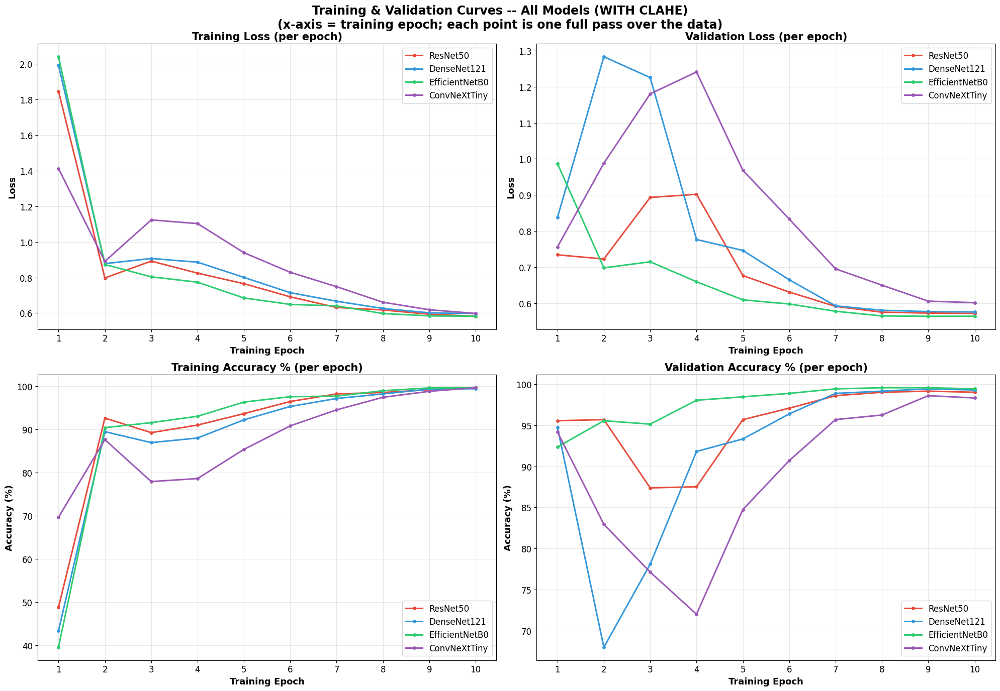

In [ ]:
def plot_training_curves(all_histories, save_path=None):
    colors = ['#E74C3C', '#3498DB', '#2ECC71', '#9B59B6']

    fig, axes = plt.subplots(2, 2, figsize=(20, 14))
    fig.suptitle(f'Training & Validation Curves -- All Models (WITH CLAHE)\n'
                 f'(x-axis = training epoch; each point is one full pass over the data)',
                 fontsize=17, fontweight='bold')

    for (model_name, history), color in zip(all_histories.items(), colors):
        epochs = range(1, len(history['train_loss']) + 1)
        axes[0, 0].plot(epochs, history['train_loss'], label=model_name, color=color, linewidth=2.2, marker='o', markersize=4)
        axes[0, 1].plot(epochs, history['val_loss'], label=model_name, color=color, linewidth=2.2, marker='o', markersize=4)
        axes[1, 0].plot(epochs, history['train_acc'], label=model_name, color=color, linewidth=2.2, marker='o', markersize=4)
        axes[1, 1].plot(epochs, history['val_acc'], label=model_name, color=color, linewidth=2.2, marker='o', markersize=4)

    titles = ['Training Loss (per epoch)', 'Validation Loss (per epoch)',
              'Training Accuracy % (per epoch)', 'Validation Accuracy % (per epoch)']
    ylabels = ['Loss', 'Loss', 'Accuracy (%)', 'Accuracy (%)']

    max_ep = max(len(h['train_loss']) for h in all_histories.values())
    for ax, title, ylabel in zip(axes.flatten(), titles, ylabels):
        ax.set_title(title, fontsize=15, fontweight='bold')
        ax.set_xlabel('Training Epoch', fontsize=13, fontweight='bold')
        ax.set_ylabel(ylabel, fontsize=13, fontweight='bold')
        ax.set_xticks(range(1, max_ep + 1))
        ax.tick_params(axis='both', labelsize=12)
        ax.legend(fontsize=12)
        ax.grid(True, alpha=0.3)

    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()

plot_training_curves(all_histories, save_path=OUT_DIR / 'figures' / 'training_curves.png')


## Phase 11: Individual Model Evaluation (Test Set)

In [ ]:
def compute_metrics(y_true, y_pred, y_probs, class_names):
    y_probs = np.array(y_probs, dtype=np.float64)
    y_probs = y_probs / y_probs.sum(axis=1, keepdims=True)

    return {
        'accuracy':  accuracy_score(y_true, y_pred),
        'precision': precision_score(y_true, y_pred, average='macro', zero_division=0),
        'recall':    recall_score(y_true, y_pred, average='macro', zero_division=0),
        'f1':        f1_score(y_true, y_pred, average='macro', zero_division=0),
        'mcc':       matthews_corrcoef(y_true, y_pred),
        'kappa':     cohen_kappa_score(y_true, y_pred),
        'roc_auc':   roc_auc_score(y_true, y_probs, multi_class='ovr', average='macro'),
    }

criterion = nn.CrossEntropyLoss()
test_results = {}

print('='*75)
print('TEST SET RESULTS')
print('='*75)

for model_name, model in trained_models.items():
    model.eval()
    _, test_acc, preds, probs, labels = evaluate(model, test_loader, criterion, DEVICE)
    metrics = compute_metrics(labels, preds, probs, CLASS_NAMES)
    test_results[model_name] = {
        'preds': preds, 'probs': probs, 'labels': labels, 'metrics': metrics
    }
    print(f'{model_name:20s} | Acc: {metrics["accuracy"]*100:.3f}% | '
          f'F1: {metrics["f1"]*100:.3f}% | '
          f'MCC: {metrics["mcc"]:.4f} | '
          f'AUC: {metrics["roc_auc"]:.4f} | '
          f'Kappa: {metrics["kappa"]:.4f}')

print('='*75)


TEST SET RESULTS


Eval:   0%|          | 0/23 [00:00<?, ?it/s]

ResNet50             | Acc: 99.861% | F1: 99.876% | MCC: 0.9985 | AUC: 1.0000 | Kappa: 0.9985


Eval:   0%|          | 0/23 [00:00<?, ?it/s]

DenseNet121          | Acc: 99.861% | F1: 99.870% | MCC: 0.9985 | AUC: 1.0000 | Kappa: 0.9985


Eval:   0%|          | 0/23 [00:00<?, ?it/s]

EfficientNetB0       | Acc: 99.861% | F1: 99.876% | MCC: 0.9985 | AUC: 1.0000 | Kappa: 0.9985


Eval:   0%|          | 0/23 [00:00<?, ?it/s]

ConvNeXtTiny         | Acc: 98.615% | F1: 98.637% | MCC: 0.9849 | AUC: 0.9998 | Kappa: 0.9848


In [ ]:
# ---- Metrics Comparison Table ----
rows = []
for model_name, result in test_results.items():
    m = result['metrics']
    rows.append({
        'Model': model_name,
        'Accuracy (%)': f"{m['accuracy']*100:.3f}",
        'Precision (%)': f"{m['precision']*100:.3f}",
        'Recall (%)': f"{m['recall']*100:.3f}",
        'F1 (%)': f"{m['f1']*100:.3f}",
        'MCC': f"{m['mcc']:.4f}",
        'Cohen Kappa': f"{m['kappa']:.4f}",
        'ROC-AUC': f"{m['roc_auc']:.4f}",
    })

metrics_df = pd.DataFrame(rows)
print('\n=== Individual Model Performance on Test Set ===')
print(metrics_df.to_string(index=False))
metrics_df.to_csv(OUT_DIR / 'individual_model_metrics.csv', index=False)



=== Individual Model Performance on Test Set ===
         Model Accuracy (%) Precision (%) Recall (%) F1 (%)    MCC Cohen Kappa ROC-AUC
      ResNet50       99.861        99.870     99.884 99.876 0.9985      0.9985  1.0000
   DenseNet121       99.861        99.863     99.879 99.870 0.9985      0.9985  1.0000
EfficientNetB0       99.861        99.870     99.884 99.876 0.9985      0.9985  1.0000
  ConvNeXtTiny       98.615        98.761     98.554 98.637 0.9849      0.9848  0.9998


## Phase 12: Confusion Matrices

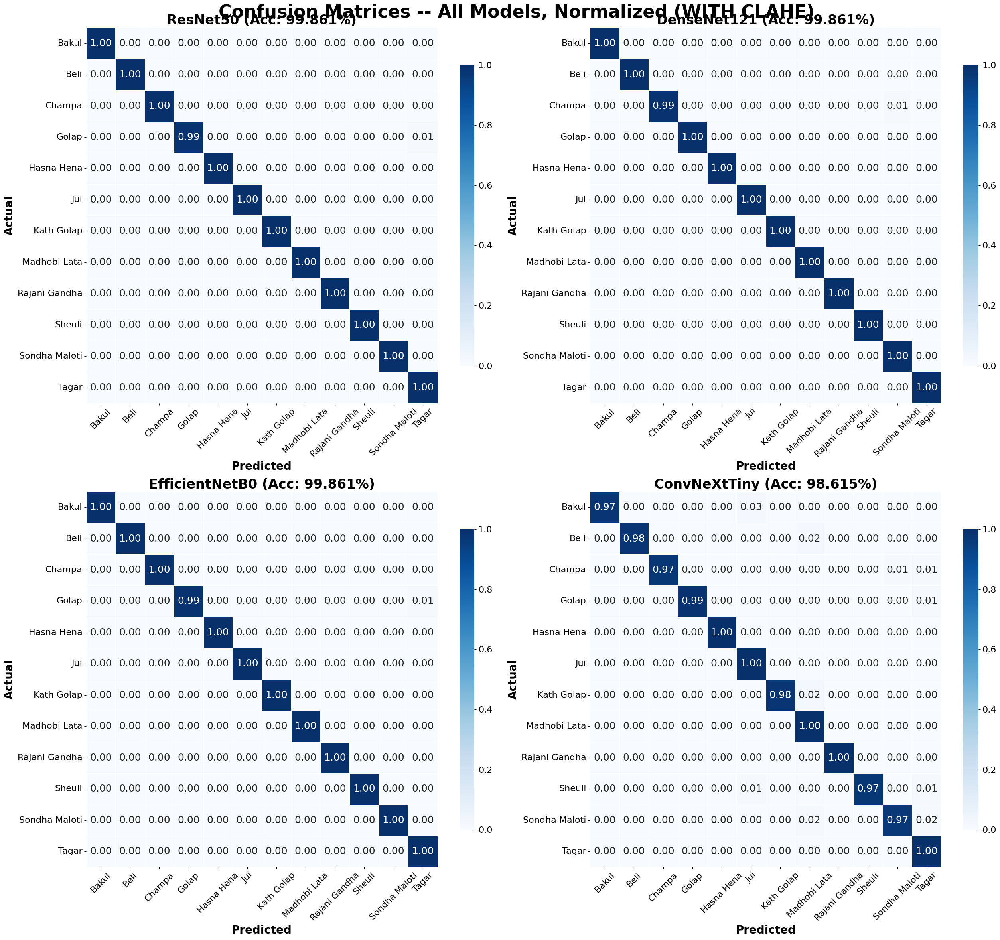

In [ ]:
def plot_confusion_matrix(y_true, y_pred, class_names, title, ax):
    cm = confusion_matrix(y_true, y_pred)
    cm_norm = cm.astype(float) / cm.sum(axis=1)[:, np.newaxis]

    sns.heatmap(cm_norm, annot=True, fmt='.2f', cmap='Blues',
                xticklabels=class_names, yticklabels=class_names,
                ax=ax, linewidths=0.5, cbar_kws={'shrink': 0.8},
                annot_kws={'size': 18})  # Heatmap cell numbers: 11 -> 18

    cbar = ax.collections[0].colorbar
    cbar.ax.tick_params(labelsize=16)  # Colorbar tick text: 11 -> 16

    ax.set_title(title, fontweight='bold', fontsize=24)  # Subplot title: 15 -> 24
    ax.set_xlabel('Predicted', fontsize=20, fontweight='bold')  # X-label: 13 -> 20
    ax.set_ylabel('Actual', fontsize=20, fontweight='bold')  # Y-label: 13 -> 20

    ax.tick_params(axis='x', rotation=45, labelsize=16)  # X-axis tick labels: 11 -> 16
    ax.tick_params(axis='y', rotation=0, labelsize=16)  # Y-axis tick labels: 11 -> 16


fig, axes = plt.subplots(2, 2, figsize=(26, 24))
# Main title: 20 -> 32
fig.suptitle(f'Confusion Matrices -- All Models, Normalized (WITH CLAHE)', fontsize=32, fontweight='bold')

for ax, (model_name, result) in zip(axes.flatten(), test_results.items()):
    plot_confusion_matrix(
        result['labels'], result['preds'], CLASS_NAMES,
        f'{model_name} (Acc: {result["metrics"]["accuracy"]*100:.3f}%)', ax
    )

plt.tight_layout()
plt.savefig(OUT_DIR / 'figures' / 'confusion_matrices.png', dpi=300, bbox_inches='tight')
plt.show()

## Phase 13: ROC Curves (Multi-Class OvR)

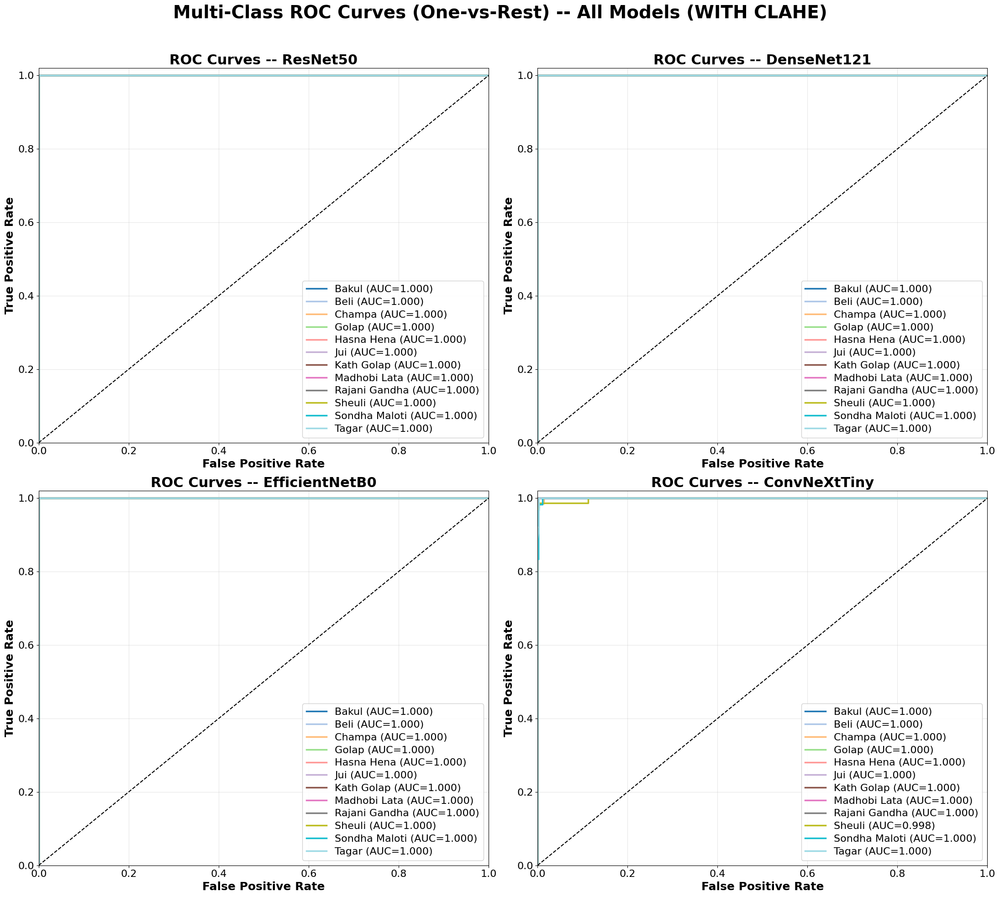

In [ ]:
def plot_roc_curves(y_true, y_probs, class_names, model_name, ax):
    y_bin = label_binarize(y_true, classes=range(len(class_names)))
    colors = plt.cm.tab20(np.linspace(0, 1, len(class_names)))

    for i, (cls, color) in enumerate(zip(class_names, colors)):
        fpr, tpr, _ = roc_curve(y_bin[:, i], y_probs[:, i])
        roc_auc = auc(fpr, tpr)
        # Increased line width (lw=2.5) to balance larger text
        ax.plot(fpr, tpr, color=color, lw=2.5, label=f'{cls} (AUC={roc_auc:.3f})')

    ax.plot([0,1], [0,1], 'k--', lw=1.5)
    ax.set_xlim([0,1]); ax.set_ylim([0,1.02])

    # --- Increased Font Sizes ---
    ax.set_xlabel('False Positive Rate', fontsize=18, fontweight='bold')
    ax.set_ylabel('True Positive Rate', fontsize=18, fontweight='bold')
    ax.set_title(f'ROC Curves -- {model_name}', fontsize=22, fontweight='bold')
    ax.tick_params(axis='both', labelsize=16)

    # --- Scaled-Up Legend ---
    ax.legend(
        loc='lower right',
        fontsize=16,            # Increased from 9 -> 16
        ncol=1,
        framealpha=0.9,
        handlelength=2.0,       # Keeps legend line indicators visible
        labelspacing=0.35
    )
    ax.grid(alpha=0.3)


fig, axes = plt.subplots(2, 2, figsize=(22, 20))

# --- Scaled Suptitle ---
fig.suptitle(
    f'Multi-Class ROC Curves (One-vs-Rest) -- All Models (WITH CLAHE)',
    fontsize=28,
    fontweight='bold'
)

for ax, (model_name, result) in zip(axes.flatten(), test_results.items()):
    plot_roc_curves(result['labels'], result['probs'], CLASS_NAMES, model_name, ax)

# Prevent title overlap with subplots on large figures
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.savefig(OUT_DIR / 'figures' / 'roc_curves.png', dpi=300, bbox_inches='tight')
plt.show()